# TPC-C Multi-Tenant with Distributed PVC and Tuned PostgreSQL 17.5 - Version 24

* data is generated and loaded into databases in a distributed filesystem
* experiments do not use preloaded data

* PostgreSQL uses improved args:

In [1]:
import pandas as pd
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np

from bexhoma import collectors

%matplotlib inline

# Functions for Nice Plots

In [2]:
def sanitize_filename(title, max_length=100):
    # Replace non-alphanumeric characters with underscores
    safe = re.sub(r'[^a-zA-Z0-9-_]+', '_', title.strip())
    # Truncate to a safe length
    return safe[:max_length].rstrip('_')
    
def plot_bars(df, y, title, estimator):
    df_plot = df.copy()
    #df_plot = df_plot[df_plot['client']=='1']
    df_plot = df_plot.sort_values(['num_tenants','type'])
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    # Create the plot
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=df_plot,
        x='num_tenants',
        y=y,
        hue='type',
        estimator=estimator,
        palette='Set2',
        hue_order=hue_order
    )
    show_height = False
    if show_height:
        for bar in ax.patches:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,  # X: center of bar
                    height,                             # Y: top of bar
                    f'{height:.1f}',                    # Text (1 decimal place)
                    ha='center', va='bottom', fontsize=8
                )
    # Get tick positions (i.e., the x-axis categories)
    xticks = ax.get_xticks()
    bar_width = ax.patches[0].get_width()
    # Create a mapping from (num_tenants, type) to hatch
    grouped = df_plot.groupby(['num_tenants', 'type']).agg({y: estimator}).reset_index()
    #print(grouped)
    grouped_dict = {(row['num_tenants'], row['type']): hatch_map[row['type']] for _, row in grouped.iterrows()}
    bars = sorted(ax.patches, key=lambda bar: bar.get_x() if bar.get_height() > 0 else 10000)
    for bar, (_, row) in zip(bars, grouped.iterrows()):
        bar.my_id = (row['num_tenants'], row['type'])  # or anything else like an index or uuid
        bar.set_hatch(hatch_map[row['type']]) #grouped_dict[(bar.my_id)])
        bar.set_edgecolor('black')
        bar.set_linewidth(1)
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
    # Final touches
    plt.legend(title='Type')
    ax.legend(fontsize=18)
    #ax.legend(fontsize=18, loc='upper left', bbox_to_anchor=(1, 1))  # move outside
    plt.title(f"{title}", fontsize=24)
    #plt.title(f"{title} by Number of Tenants and Type", fontsize=24)
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    # Remove y-axis label
    ax.set_ylabel('')  # or ax.set(ylabel='')
    plt.tight_layout()
    if b_plot_save:
        filename = filename_prefix + sanitize_filename(title) + ".png"    
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_boxplots(df, y, title):
    plt.figure(figsize=(10, 6))
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot boxplots grouped by num_tenants and colored by type
    ax = sns.boxplot(
        data=df,
        x='num_tenants',
        y=y,#'Goodput (requests/second)',
        hue='type',
        palette='Set2'  # consistent colors per type
    )
    # Add vertical separator lines between groups
    # Get the number of unique num_tenants and type
    num_groups = df['num_tenants'].nunique()
    num_types = df['type'].nunique()
    
    # Extract hue order
    hue_order = ax.get_legend_handles_labels()[1]
    num_hue = len(hue_order)
    
    # Get hue order from seaborn (types)
    _, type_order = ax.get_legend_handles_labels()
    num_types = len(type_order)
    
    #print(len(ax.patches))
    # Set hatches correctly: patches are grouped by x then by hue
    for i, patch in enumerate(ax.patches):
        #print(i)
        type_index = i // (num_groups)
        if type_index >= num_types:
            break
        type_name = type_order[type_index]
        patch.set_hatch(hatch_map.get(type_name, ''))
        #print(hatch_map.get(type_name, ''))
        patch.set_edgecolor('black')
        patch.set_linewidth(1)
    
    # Each num_tenants group has num_types boxes
    for i in range(1, num_groups):
        xpos = i - 0.5 #0.5
        ax.axvline(x=xpos, color='gray', linestyle='--', alpha=0.5)
    
    
    # Update legend with matching hatches
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
        handle.set_edgecolor('black')
        handle.set_linewidth(1)
    
    #title = "Goodput [req/s] Distribution per Tenant"
    plt.title(title, fontsize=24)
    plt.xlabel("Number of Tenants")
    plt.ylabel("")#"Goodput (requests/second)")
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    plt.legend(title="Type")
    ax.legend(fontsize=18)
    plt.tight_layout()
    if b_plot_save:
        filename = filename_prefix + sanitize_filename(title) + ".png"    
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_lines(df, y, title):
    plt.figure(figsize=(10, 6))

    # Consistent colors per type
    palette = {
        'container': '#66c2a5',
        'database': '#fc8d62',
        'schema': '#8da0cb'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot lineplot grouped by num_tenants and colored by type

    ax = sns.lineplot(
        data=df.reset_index(),
        x="timestamp",
        y=y,
        hue="type",
        hue_order=hue_order,
        style="num_tenants",          # different line styles per type
        markers=False,          # markers at points
        dashes=True,
        estimator=None,   # plot raw data without aggregation
        errorbar=None,
        #fill=False,         # <- this disables area fill!
        #ci=None,
        palette=palette
    )

    # Axis labels and title
    plt.title(title, fontsize=24)
    plt.xlabel("Second", fontsize=18)
    #plt.ylabel(y, fontsize=18)
    ax.set(ylabel=None)
    ax.tick_params(axis='both', labelsize=16)

    # Legend formatting
    plt.legend(fontsize=16, title_fontsize=18)
    
    # Save
    if b_plot_save:
        filename = filename_prefix + "_" + title.replace(" ", "_") + ".png"
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

#print("Seaborn version:", sns.__version__)

# Collect Results

In [3]:
#path = r"C:\data\benchmarks"
path = r"/home/perdelt/benchmarks"
filename_prefix = "tpcc_ramdisk_"
b_plot_save = True

In [4]:
codes = [
    
    "1758124731", # container 1
    "1758122773", # database 1
    "1758120831", # schema 1

    "1758115998", # container 2
    "1758113938", # database 2
    "1758111904", # schema 2

    "1758194134", # container 3
    "1758156855", # database 3
    "1758154781", # schema 3

    "1758165872", # container 4
    "1758163793", # database 4
    "1758161675", # schema 4

    "1758173241", # container 5
    "1758171060", # database 5
    "1758168886", # schema 5

    "1758181052", # container 6
    "1758178785", # database 6
    "1758176529", # schema 6

    "1758189642", # container 7
    "1758187366", # database 7
    "1758185027", # schema 7

    "1758140937", # container 8
    "1758138639", # database 8
    "1758136338", # schema 8

    "1758150016", # container 9
    "1758147669", # database 9
    "1758145330", # schema 9

    "1758131305", # container 10
    "1758129008", # database 10
    "1758126683", # schema 10

]

codes

['1758124731',
 '1758122773',
 '1758120831',
 '1758115998',
 '1758113938',
 '1758111904',
 '1758194134',
 '1758156855',
 '1758154781',
 '1758165872',
 '1758163793',
 '1758161675',
 '1758173241',
 '1758171060',
 '1758168886',
 '1758181052',
 '1758178785',
 '1758176529',
 '1758189642',
 '1758187366',
 '1758185027',
 '1758140937',
 '1758138639',
 '1758136338',
 '1758150016',
 '1758147669',
 '1758145330',
 '1758131305',
 '1758129008',
 '1758126683']

In [5]:
collect = collectors.benchbase(path, codes)

# Get all Metrics Metadata

In [6]:
code = codes[0]
evaluate = collect.get_evaluator(code)
collect.df_metrics = collect.get_metrics(evaluate)

collect.df_metrics

,title,active,type,metric
total_cpu_memory,Memory Usage [MiB],True,cluster,gauge
total_cpu_memory_cached,Memory Usage Cached [MiB],True,cluster,gauge
total_cpu_util,CPU Utilization,True,cluster,gauge
total_cpu_throttled,CPU Throttle,True,cluster,gauge
total_cpu_throttled_s,CPU Throttled Time [s],True,cluster,counter
total_cpu_util_others,CPU Utilization Others,False,cluster,gauge
total_cpu_util_s,CPU Utilization Time [s],True,cluster,counter
total_cpu_util_user_s,CPU User Time [s],True,cluster,counter
total_cpu_util_sys_s,CPU System Time [s],True,cluster,counter
total_cpu_util_others_s,CPU Utilization Time Others [s],False,cluster,counter


# Get Values Aggregated per SUT and per Experiment

In [7]:
df_performance = collect.get_monitoring_all(type="stream")
df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],17629.06,32311.54,17755.84,32837.34,17897.65,33450.68,29205.93,47092.24,21809.83,37297.97,...,59696.61,79244.6,59171.36,77688.02,118777.71,149059.55,66151.92,84951.53,65607.83,82238.82
Memory Usage Cached [MiB],17629.08,32311.56,17755.86,32837.36,17897.66,33450.7,29205.97,47092.27,21809.84,37297.99,...,59696.62,79244.61,59171.44,77688.1,118777.85,149059.68,66151.93,84951.54,65607.92,82238.91
CPU Utilization,19.54,19.98,20.82,21.25,22.05,21.78,25.05,23.68,21.37,22.1,...,38.39,22.41,38.37,20.92,51.02,50.34,40.09,25.86,37.52,20.66
CPU Throttle,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],12349.45,12983.29,13544.66,12893.37,14659.99,14254.0,15842.64,15744.33,13088.85,13907.77,...,24076.38,13827.35,25382.73,13191.97,32659.08,31151.97,24985.58,16341.76,24013.16,12874.21
CPU User Time [s],7296.17,7645.14,7841.38,7378.45,8303.67,8085.08,9641.76,9561.72,7810.55,8028.7,...,15245.01,8092.65,16005.45,7757.48,21515.59,20406.39,15952.93,9843.33,14953.04,7640.71
CPU System Time [s],5053.28,5338.15,5703.27,5514.92,6356.32,6168.92,6200.88,6182.62,5278.3,5879.08,...,8831.37,5734.7,9377.27,5434.49,11143.46,10745.57,9032.65,6498.43,9060.12,5233.51
Network Rx Total [MiB],24330.24,15381.13,25667.95,16514.92,25453.08,18163.91,29857.34,26074.96,24143.78,18300.93,...,33755.15,20292.88,33879.32,18843.12,55318.12,53032.69,33754.87,19612.29,31396.66,19603.56


# Bar Plots of Aggregated Values per Metric

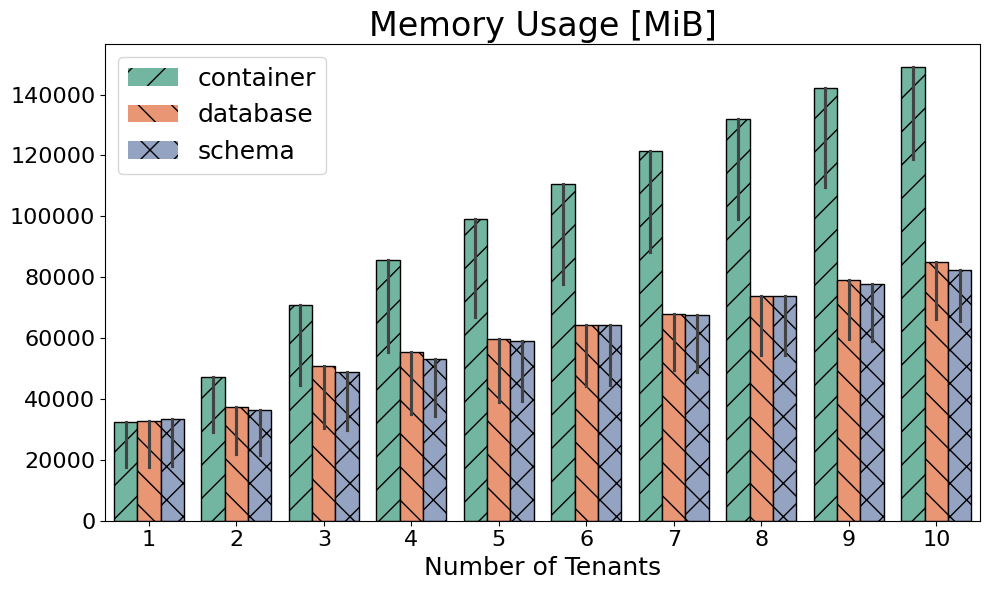

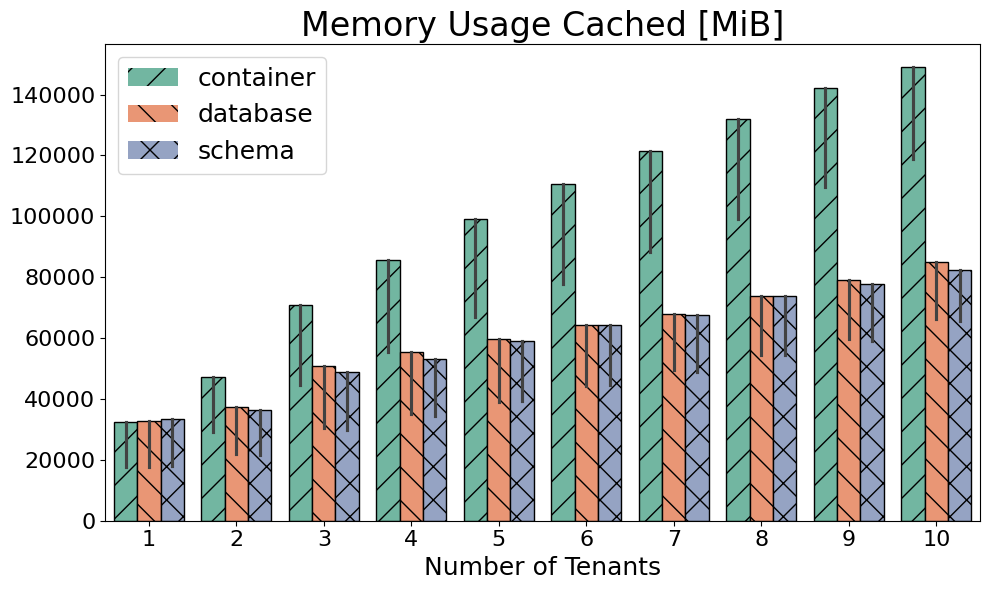

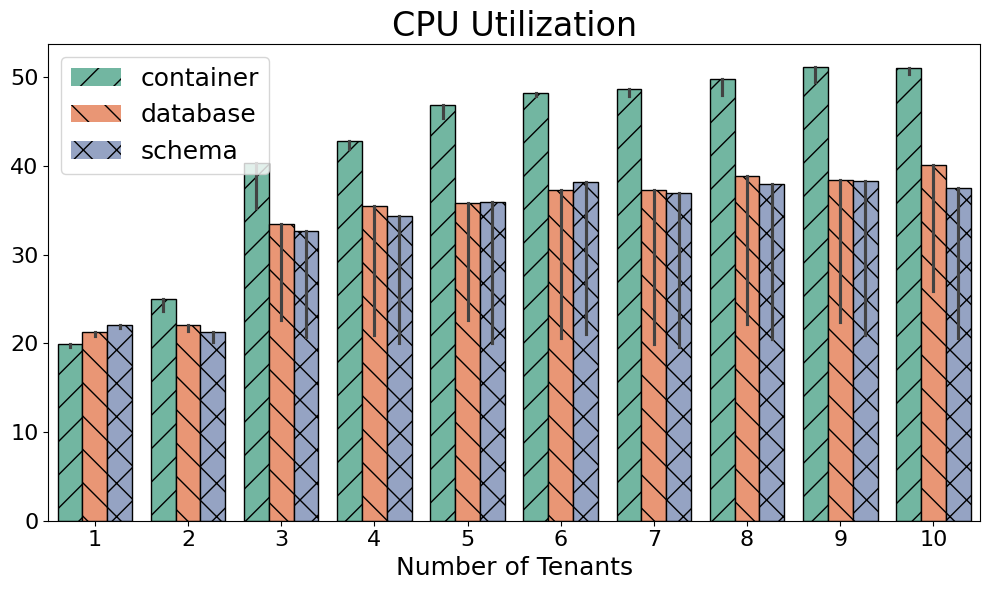

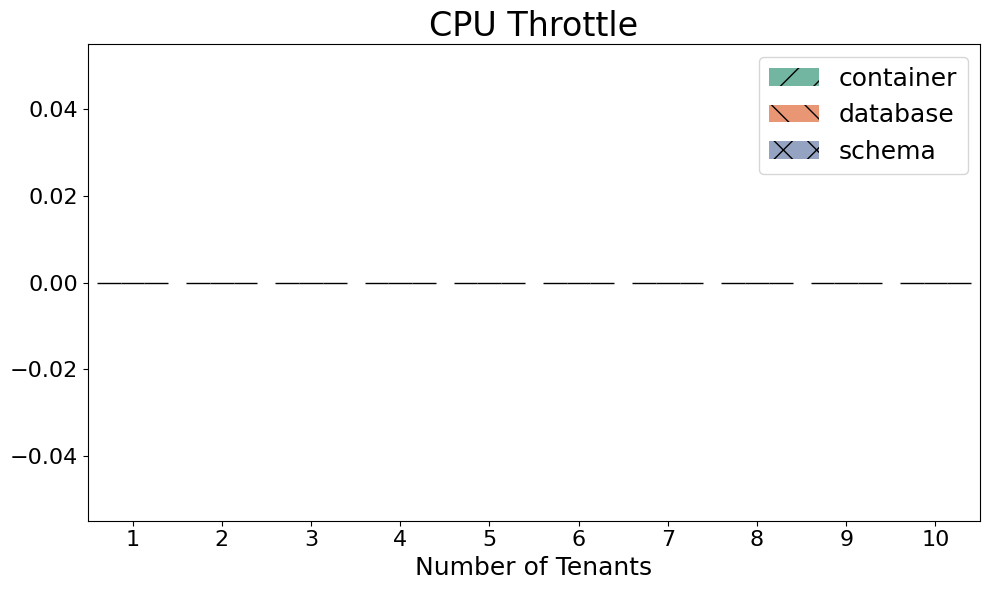

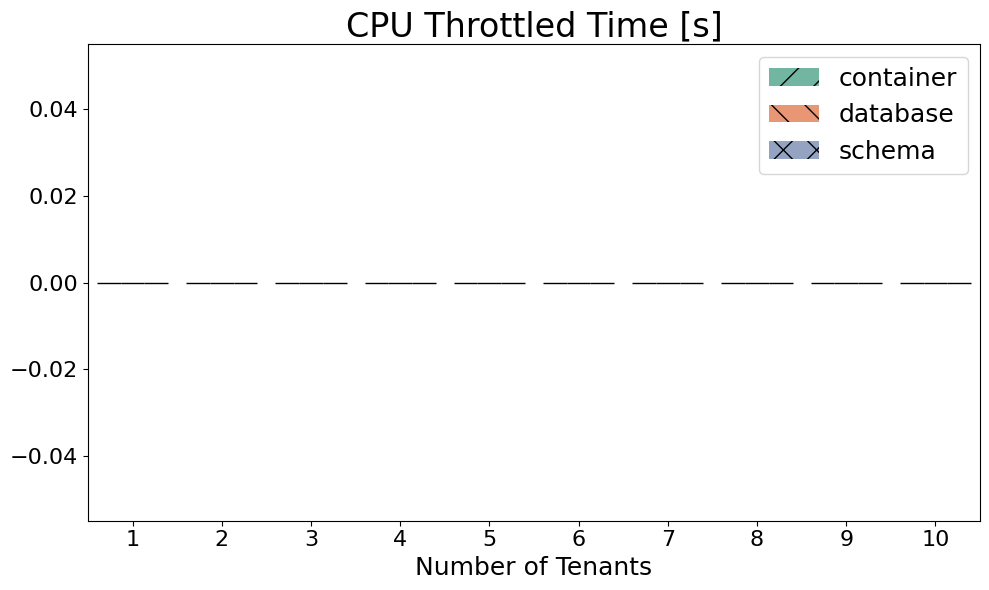

...

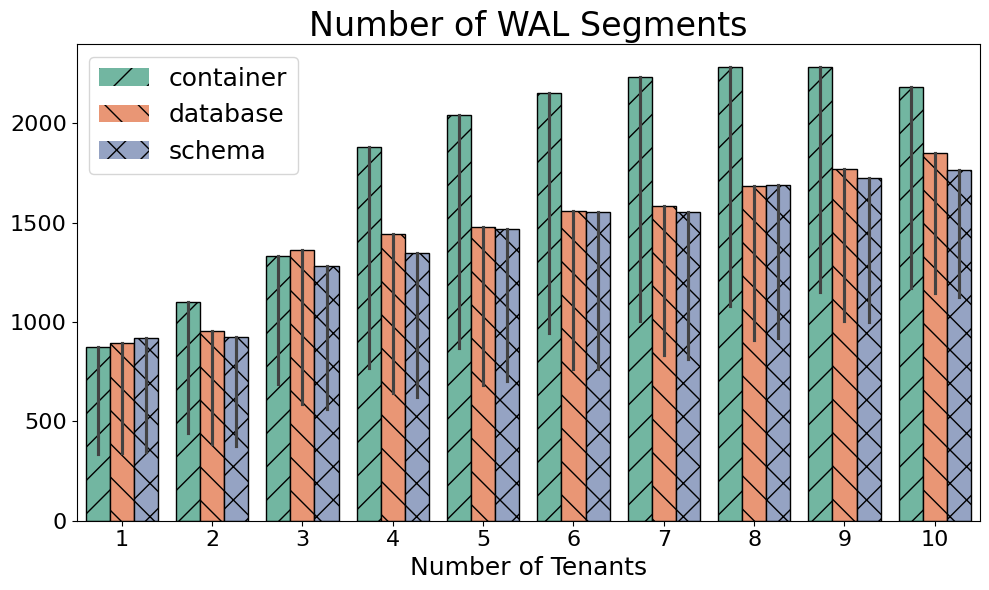

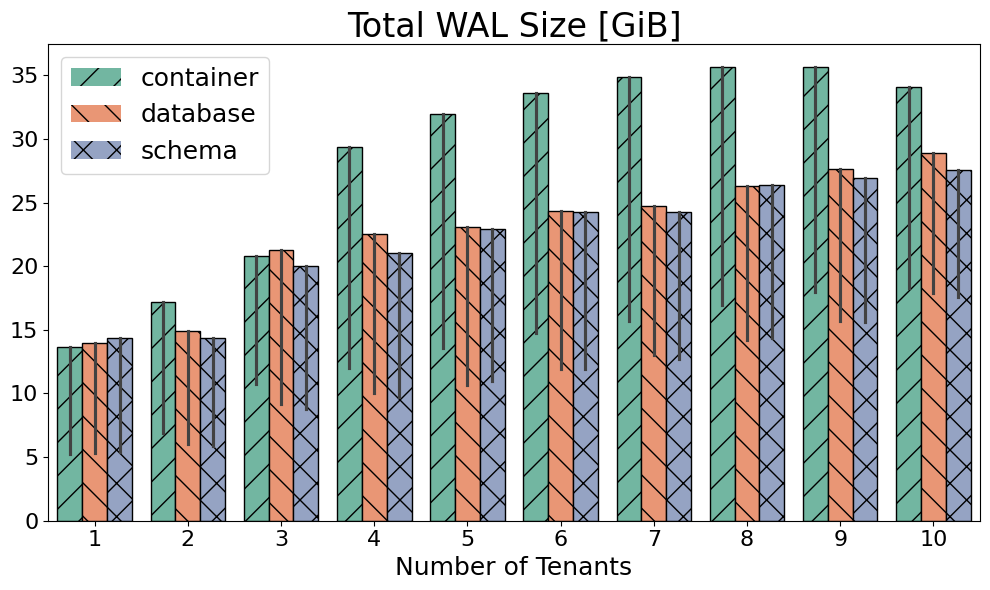

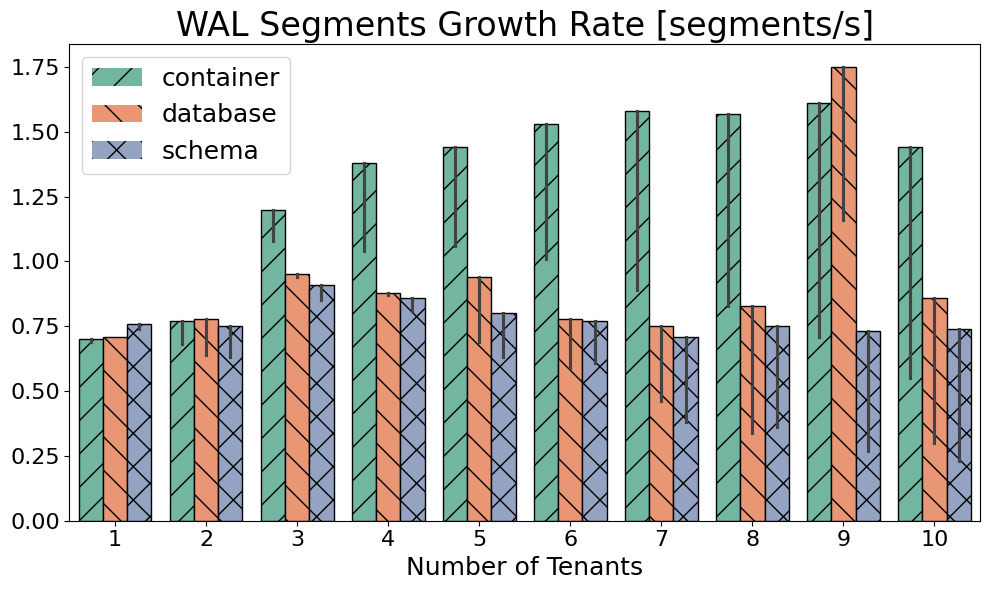

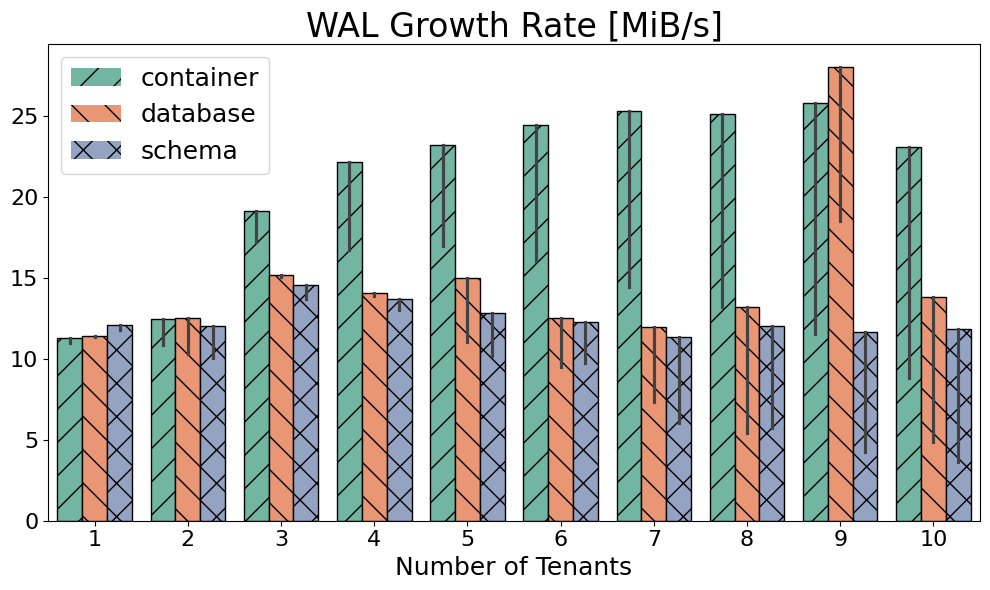

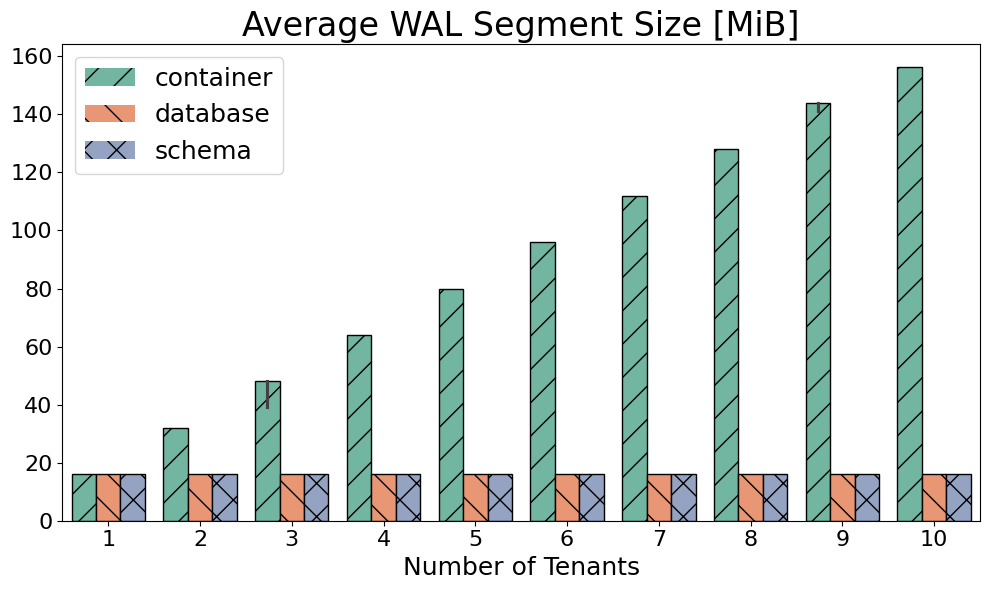

In [8]:
for idx, row in collect.df_metrics.iterrows():
    if row["active"] == False:
        continue
    col_name = row["title"]
    plot_bars(df_performance, y=col_name, title=col_name, estimator='max')

# Boxplot of All Metrics for a Single Experiment

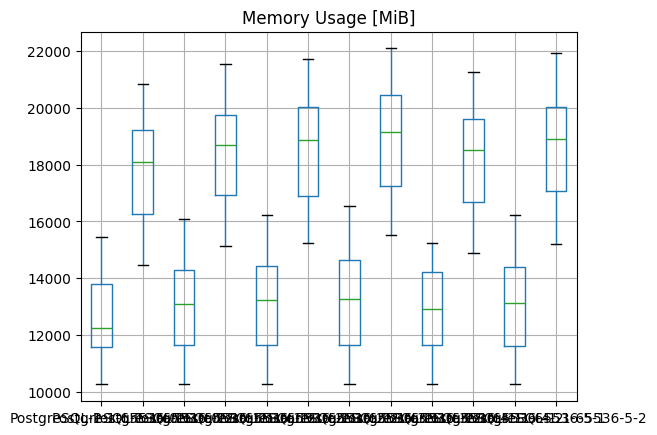

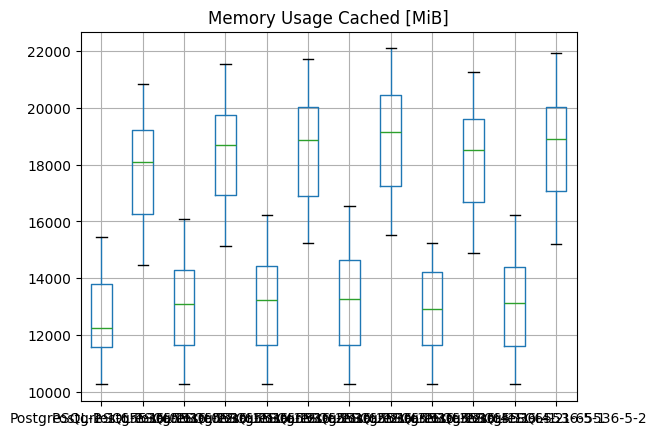

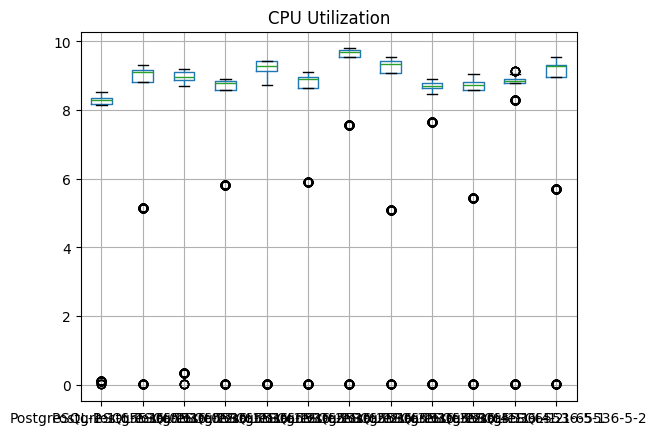

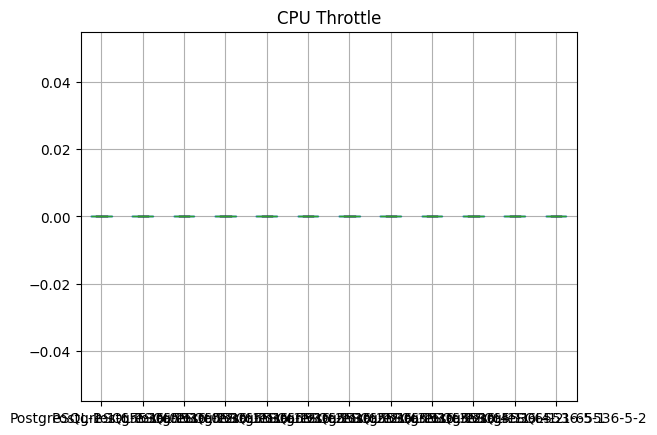

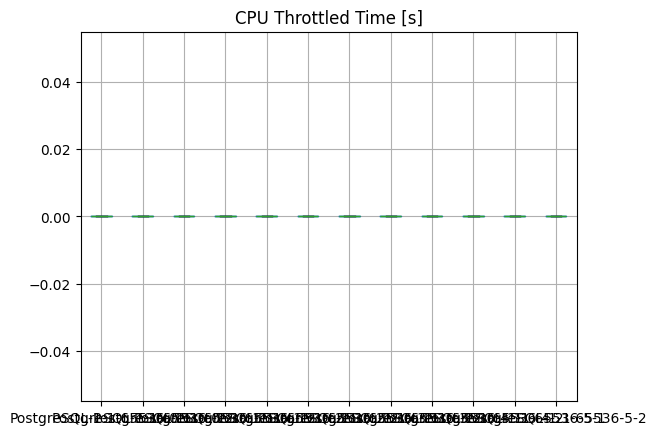

...

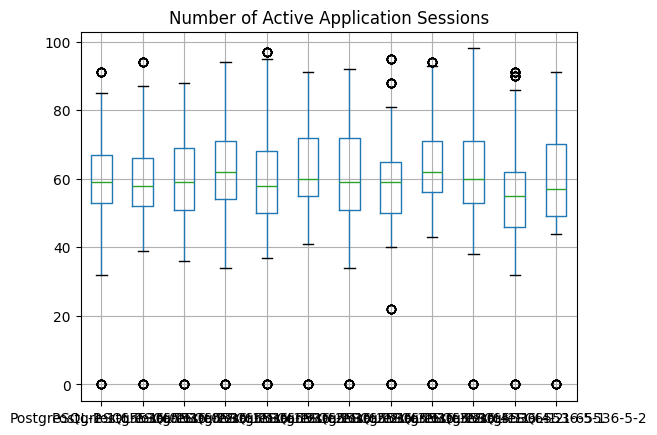

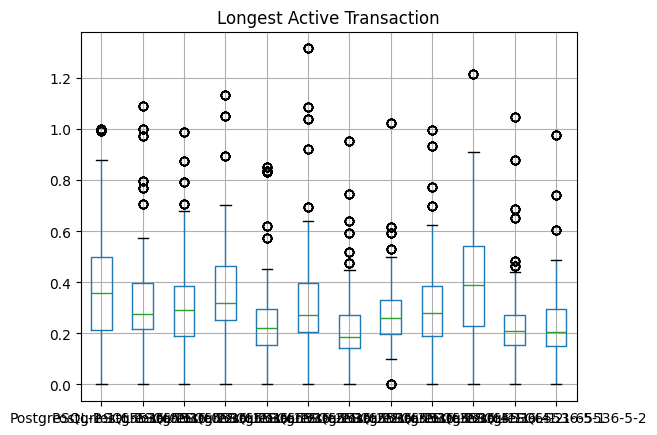

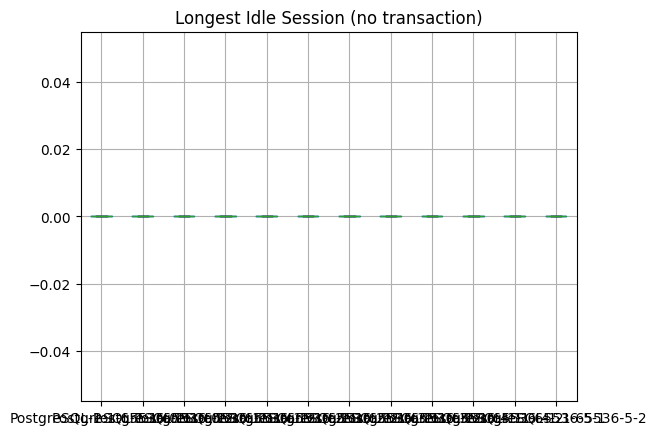

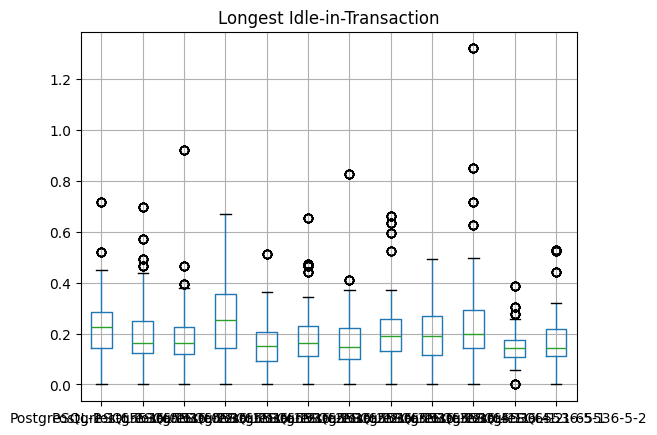

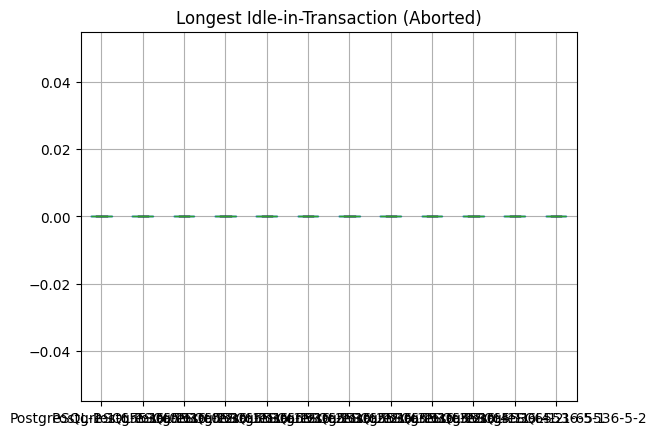

/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


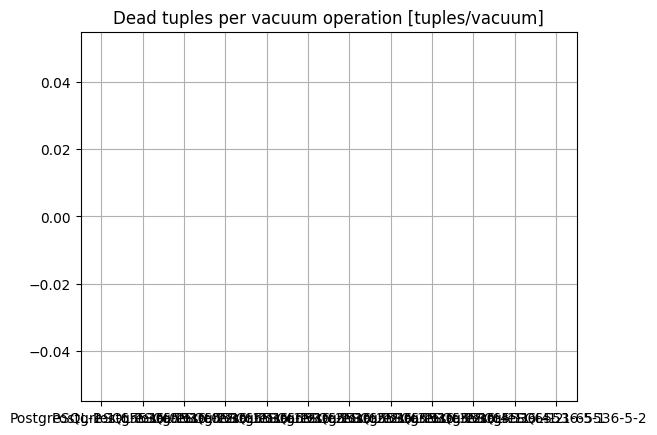

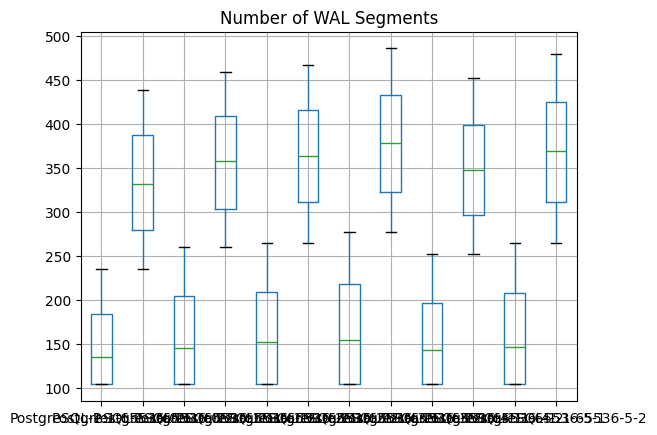

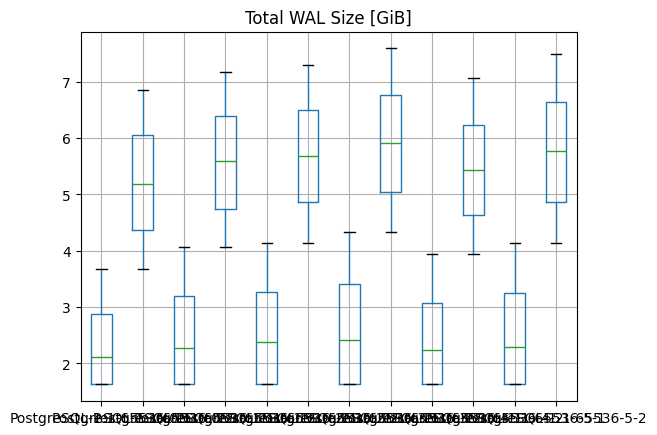

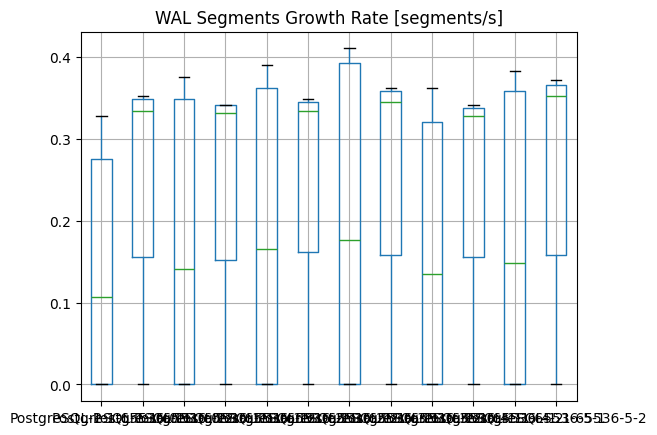

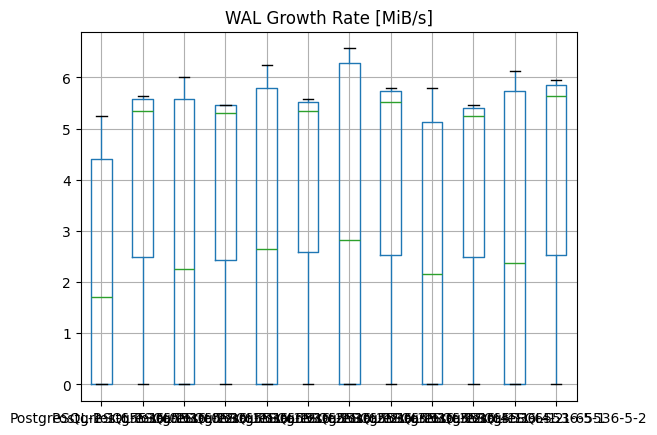

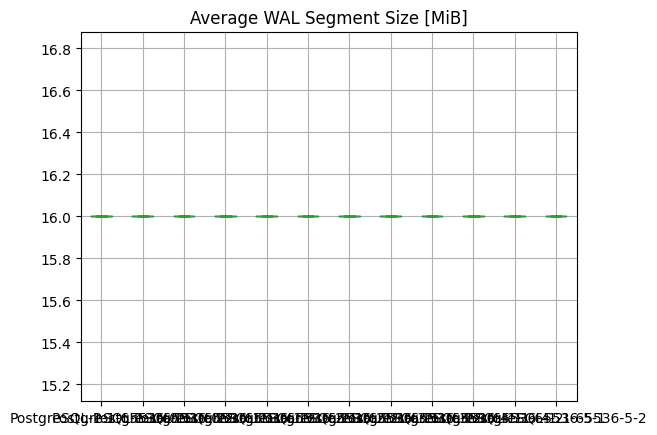

In [9]:
results = []
code = codes[15]
for idx, row in collect.df_metrics.iterrows():
    if row["active"] == False:
        continue
    #print(idx, row["title"])
    metric_name = idx
    method = 'diff' if row["metric"] == 'counter' else 'mean'
    col_name = row["title"]
    df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric_name)
    #print(df_monitoring)
    #plot_boxplots(df_monitoring, y=metric_name, title=col_name)
    ax = df_monitoring.boxplot()
    ax.set_title(col_name)
    plt.show()
    #plot_boxplots(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

# Boxplot of A Single Metric for a Single Experiment

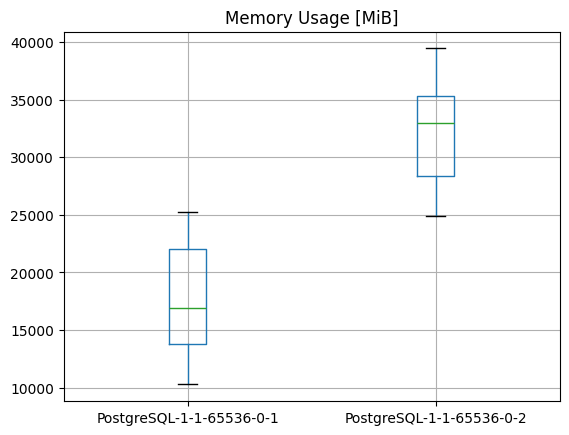

In [10]:
metric = 'pg_stat_activity_max_tx_duration_active'
#metric = 'pg_stat_database_blks_reads'
#metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
code = codes[0]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
#df_monitoring.boxplot()
ax = df_monitoring.boxplot()
ax.set_title(collect.df_metrics.loc[metric]['title'])#metric)
plt.show()

# Lineplot of a Single Metric for a Single Experiment

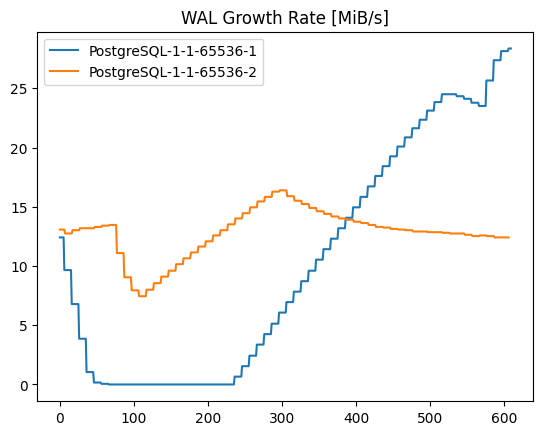

In [11]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'
metric = 'max_core_util'
metric = 'pg_stat_activity_max_tx_duration_lock'
metric = 'pg_wal_size_rate'

code = codes[14]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
ax = df_monitoring.plot()
ax.set_title(collect.df_metrics.loc[metric]['title'])
plt.show()
#df_monitoring

# Boxplot of a Single Metric for all Experiments

In [12]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'
metric = 'pg_stat_activity_count_active'
#metric = 'pg_locks_count_exclusivelock'

df_performance = collect.get_monitoring_timeseries_all(metric)
#df_performance
df_performance_first = df_performance[df_performance['client']=="1"]
#df_performance_first
df_performance_second = df_performance[df_performance['client']=="2"]
#df_performance_second
#df_performance_first['value'].describe()

## First Execution Run

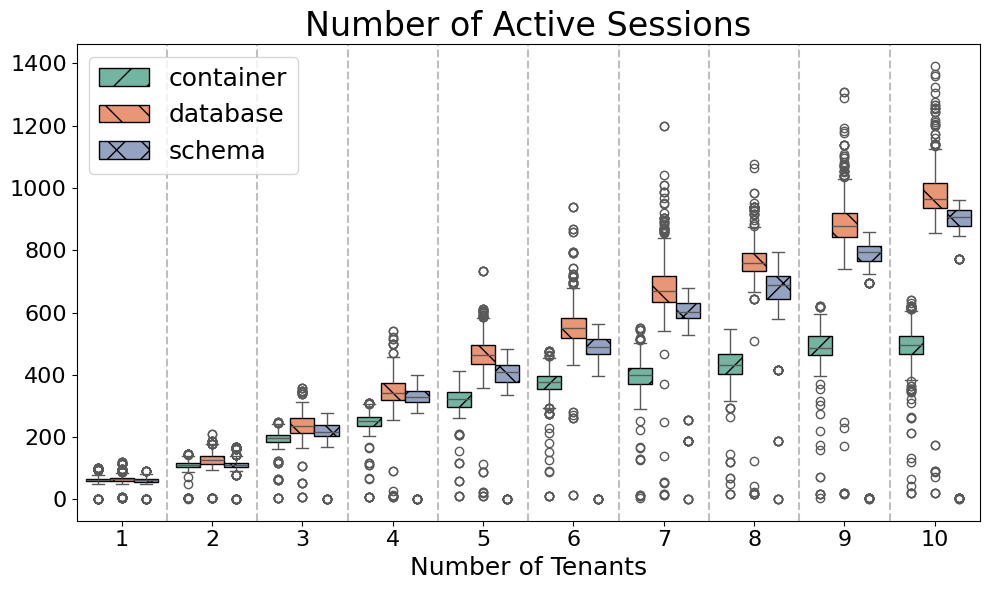

In [13]:
plot_boxplots(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

## Second Execution Run

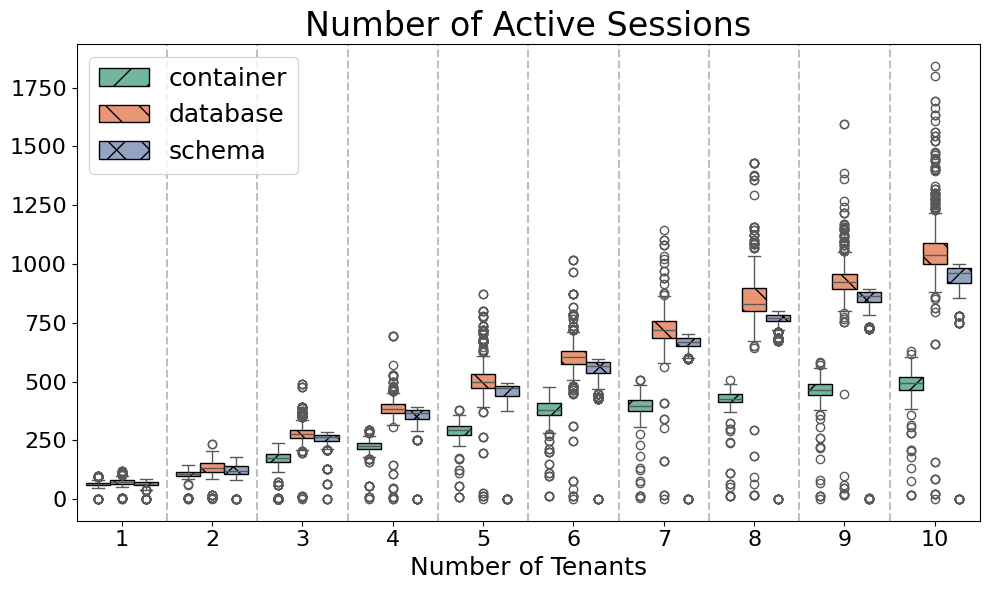

In [14]:
plot_boxplots(df_performance_second, y='value', title=collect.df_metrics.loc[metric]['title'])

# Lineplot of a Single Metric for All Experiments

## First Execution Run

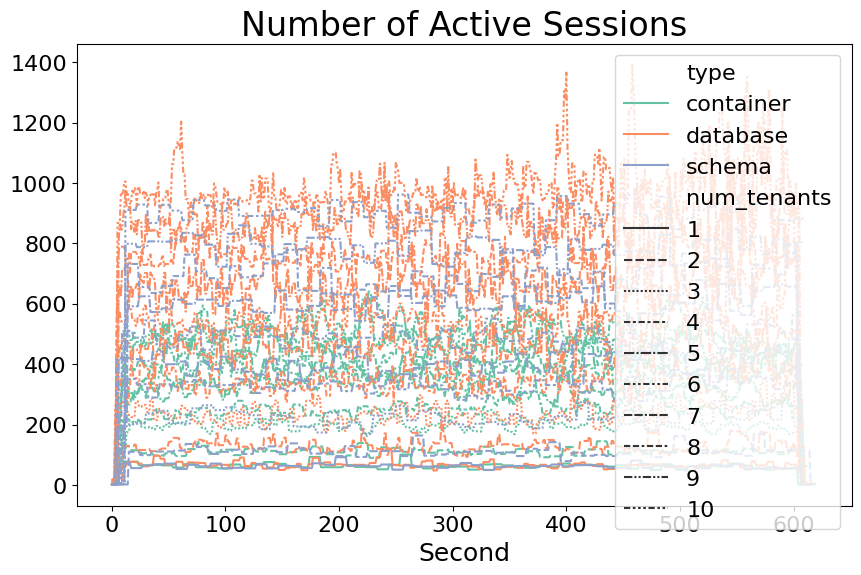

In [15]:
#df = df_performance_first[df_performance_first['type'] == 'database']
plot_lines(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

# Aggregated Data for all Clients

In [16]:
df_performance = collect.get_monitoring_single_all("stream")
df_performance

,Memory Usage [MiB],Memory Usage Cached [MiB],CPU Utilization,CPU Throttle,CPU Throttled Time [s],CPU Utilization Time [s],CPU User Time [s],CPU System Time [s],Network Rx Total [MiB],Network Tx Total [MiB],...,Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],client,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,17629.06,17629.08,19.54,0.0,0.0,12349.45,7296.17,5053.28,24330.24,23326.02,...,inf,336.44,5.26,0.70,11.28,16.00,1,container,1,1758124731
PostgreSQL-1-1-65536-0-2,32311.54,32311.56,19.98,0.0,0.0,12983.29,7645.14,5338.15,15381.13,15563.72,...,inf,875.30,13.68,0.69,10.99,16.00,2,container,1,1758124731
PostgreSQL-1-1-65536-1,17755.84,17755.86,20.82,0.0,0.0,13544.66,7841.38,5703.27,25667.95,24813.19,...,inf,342.53,5.35,0.71,11.33,16.00,1,database,1,1758122773
PostgreSQL-1-1-65536-2,32837.34,32837.36,21.25,0.0,0.0,12893.37,7378.45,5514.92,16514.92,16431.00,...,inf,894.57,13.98,0.71,11.40,16.00,2,database,1,1758122773
PostgreSQL-1-1-65536-1,17897.65,17897.66,22.05,0.0,0.0,14659.99,8303.67,6356.32,25453.08,24394.68,...,inf,346.41,5.41,0.74,11.78,16.00,1,schema,1,1758120831
PostgreSQL-1-1-65536-2,33450.68,33450.70,21.78,0.0,0.0,14254.00,8085.08,6168.92,18163.91,18085.58,...,inf,919.48,14.37,0.76,12.11,16.00,2,schema,1,1758120831
PostgreSQL-1-1-65536-0-1,14703.23,14703.25,12.53,0.0,0.0,7954.57,4855.42,3099.15,15224.40,15156.65,...,inf,224.55,3.51,0.35,5.59,16.00,1,container,2,1758115998
PostgreSQL-1-1-65536-0-2,23834.25,23834.27,11.85,0.0,0.0,7896.50,4781.17,3115.33,13227.96,13313.36,...,inf,561.51,8.77,0.39,6.32,16.00,2,container,2,1758115998
PostgreSQL-1-1-65536-1-1,14502.70,14502.72,12.52,0.0,0.0,7888.07,4786.34,3101.73,14632.94,14540.63,...,inf,217.51,3.40,0.33,5.27,16.00,1,container,2,1758115998
PostgreSQL-1-1-65536-1-2,23257.99,23258.00,11.83,0.0,0.0,7847.83,4780.55,3067.29,12847.00,12943.99,...,inf,540.53,8.45,0.38,6.13,16.00,2,container,2,1758115998


# Monitoring Aggregated Values

In [17]:
df_performance = collect.get_monitoring_all("stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T#[['Max CPU', 'client', 'type', 'num_tenants']]

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],17629.06,32311.54,17755.84,32837.34,17897.65,33450.68,29205.93,47092.24,21809.83,37297.97,...,59696.61,79244.6,59171.36,77688.02,118777.71,149059.55,66151.92,84951.53,65607.83,82238.82
Memory Usage Cached [MiB],17629.08,32311.56,17755.86,32837.36,17897.66,33450.7,29205.97,47092.27,21809.84,37297.99,...,59696.62,79244.61,59171.44,77688.1,118777.85,149059.68,66151.93,84951.54,65607.92,82238.91
CPU Utilization,19.54,19.98,20.82,21.25,22.05,21.78,25.05,23.68,21.37,22.1,...,38.39,22.41,38.37,20.92,51.02,50.34,40.09,25.86,37.52,20.66
CPU Throttle,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],12349.45,12983.29,13544.66,12893.37,14659.99,14254.0,15842.64,15744.33,13088.85,13907.77,...,24076.38,13827.35,25382.73,13191.97,32659.08,31151.97,24985.58,16341.76,24013.16,12874.21
CPU User Time [s],7296.17,7645.14,7841.38,7378.45,8303.67,8085.08,9641.76,9561.72,7810.55,8028.7,...,15245.01,8092.65,16005.45,7757.48,21515.59,20406.39,15952.93,9843.33,14953.04,7640.71
CPU System Time [s],5053.28,5338.15,5703.27,5514.92,6356.32,6168.92,6200.88,6182.62,5278.3,5879.08,...,8831.37,5734.7,9377.27,5434.49,11143.46,10745.57,9032.65,6498.43,9060.12,5233.51
Network Rx Total [MiB],24330.24,15381.13,25667.95,16514.92,25453.08,18163.91,29857.34,26074.96,24143.78,18300.93,...,33755.15,20292.88,33879.32,18843.12,55318.12,53032.69,33754.87,19612.29,31396.66,19603.56


## First Execution Run

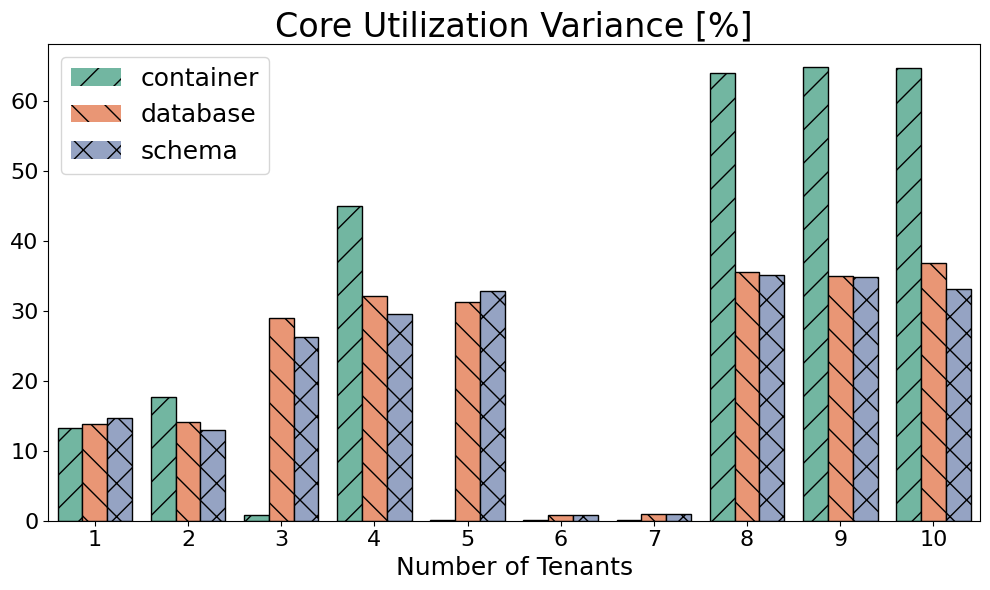

In [18]:
plot_bars(df_performance_first, y='Core Utilization Variance [%]', title='Core Utilization Variance [%]', estimator='max')

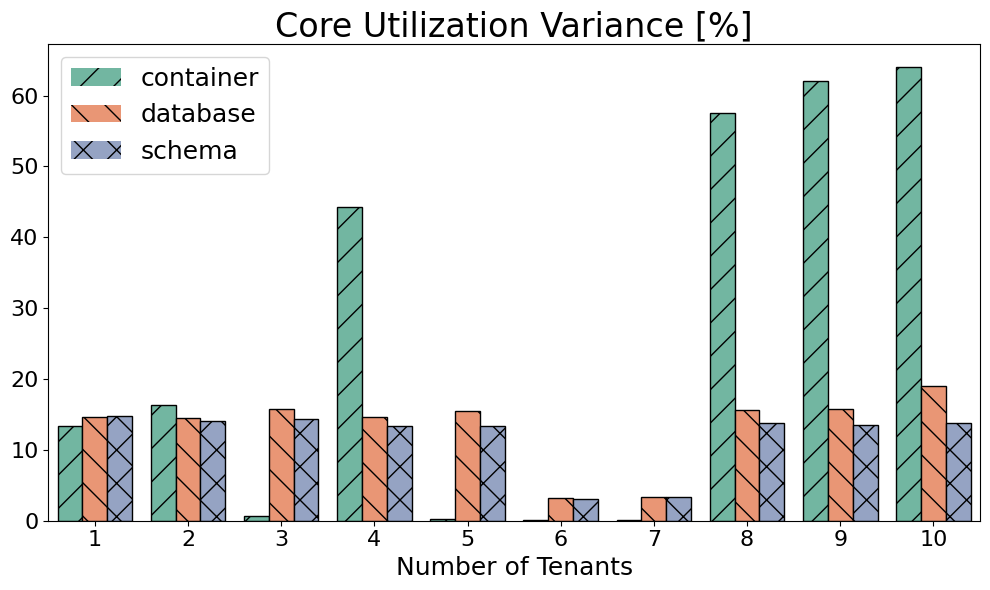

In [19]:
plot_bars(df_performance_second, y='Core Utilization Variance [%]', title='Core Utilization Variance [%]', estimator='max')

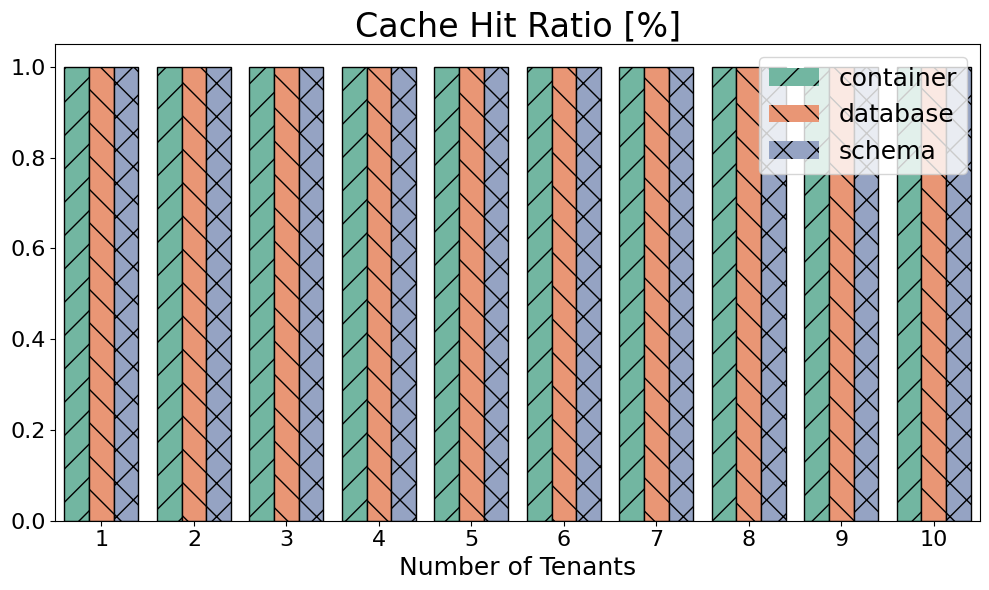

In [20]:
plot_bars(df_performance_first, y='Buffer Cache Hit Ratio', title='Cache Hit Ratio [%]', estimator='min')

## Second Execution Run

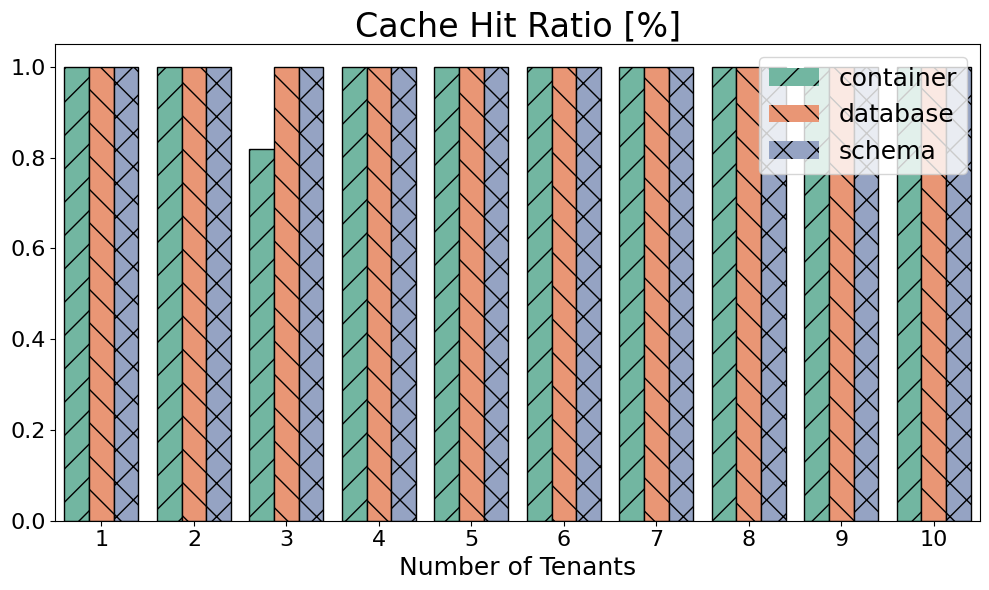

In [21]:
plot_bars(df_performance_second, y='Buffer Cache Hit Ratio', title='Cache Hit Ratio [%]', estimator='min')

# Performance Results per Tenant

In [22]:
df_performance = collect.get_performance_all_single()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,connection,configuration,experiment_run,client,pod,pod_count,bench,profile,target,time,...,Latency Distribution.Median Latency (microseconds),Latency Distribution.Minimum Latency (microseconds),Latency Distribution.25th Percentile Latency (microseconds),Latency Distribution.90th Percentile Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),Latency Distribution.75th Percentile Latency (microseconds),Latency Distribution.Average Latency (microseconds),type,num_tenants,code
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,cjf5t.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,13923,676,9467,28426,55222,20173,16332,container,1,1758124731
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,cvnnp.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,18143,832,12097,34982,58637,25801,20225,container,1,1758124731
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,h228n.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,13552,718,9152,28494,54648,19814,16073,database,1,1758122773
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,x5tv6.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,17630,786,11717,34695,57566,25472,19870,database,1,1758122773
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,sf5fv.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,13214,686,8985,28099,54511,19221,15758,schema,1,1758120831
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,p298z.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,16416,772,10937,33177,56460,23972,18753,schema,1,1758120831
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,vx8rj.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,21915,793,13890,49450,98118,33413,26538,container,2,1758115998
PostgreSQL-1-1-65536-1-1-1,PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,1,1,d9x29.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,22645,811,14144,52672,105317,35126,27813,container,2,1758115998
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,2thqm.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,25601,818,16504,55095,107943,38279,30259,container,2,1758115998


## First Execution Run

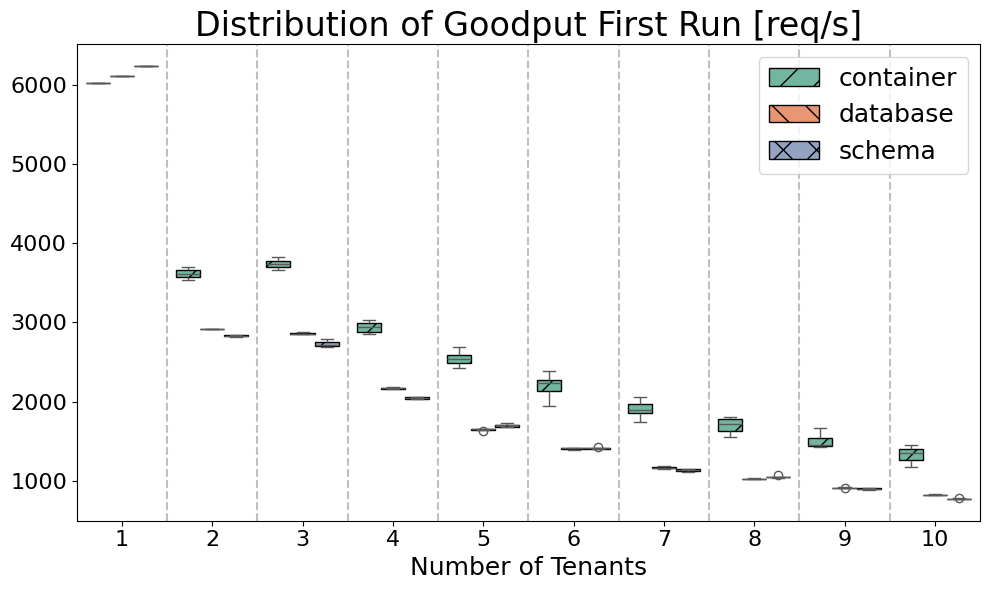

In [23]:
plot_boxplots(df_performance_first, y='Goodput (requests/second)', title='Distribution of Goodput First Run [req/s]')

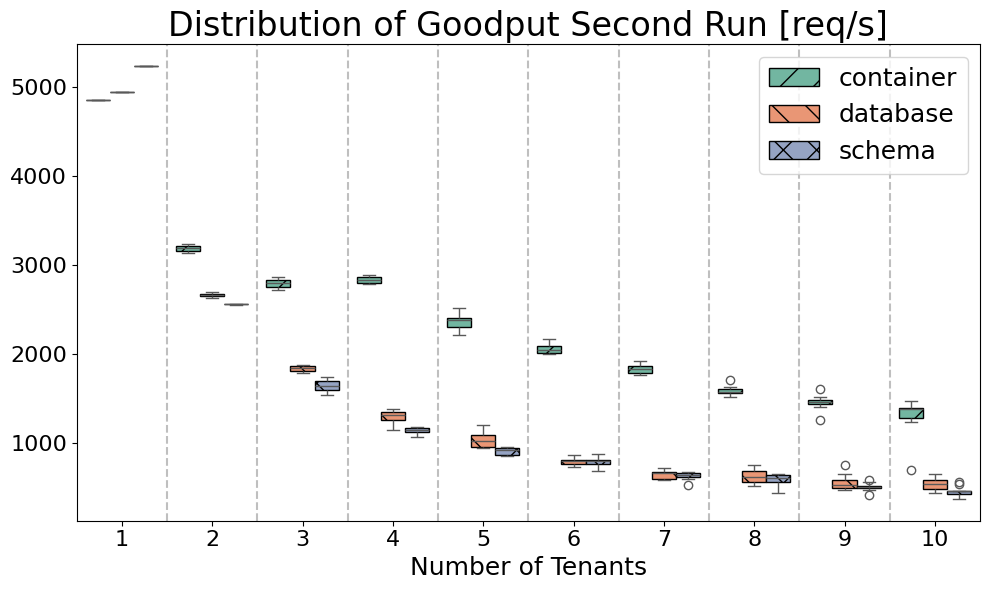

In [24]:
plot_boxplots(df_performance_second, y='Goodput (requests/second)', title='Distribution of Goodput Second Run [req/s]')

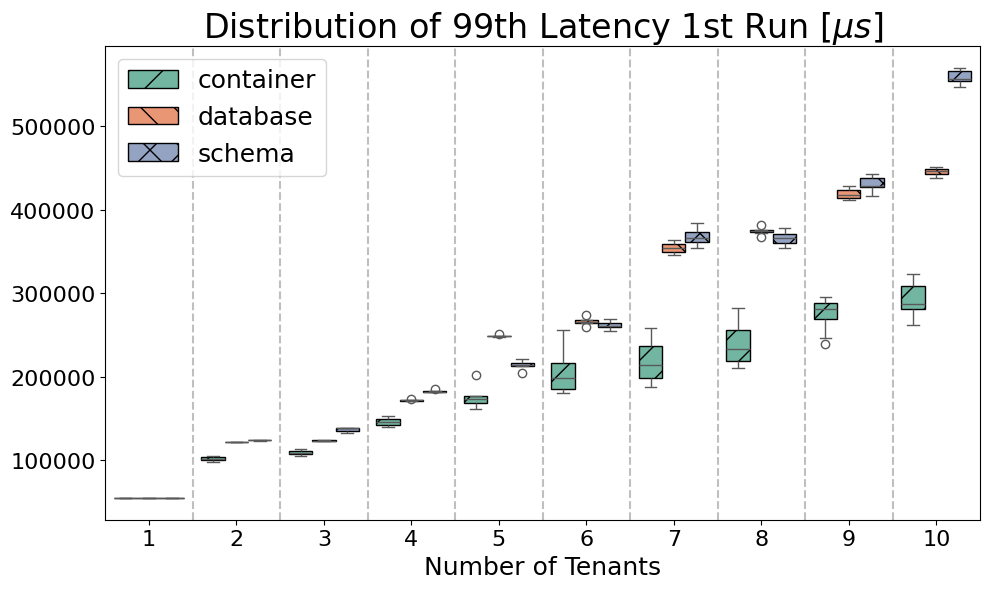

In [25]:
plot_boxplots(df_performance_first, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency 1st Run [$\mu s$]')

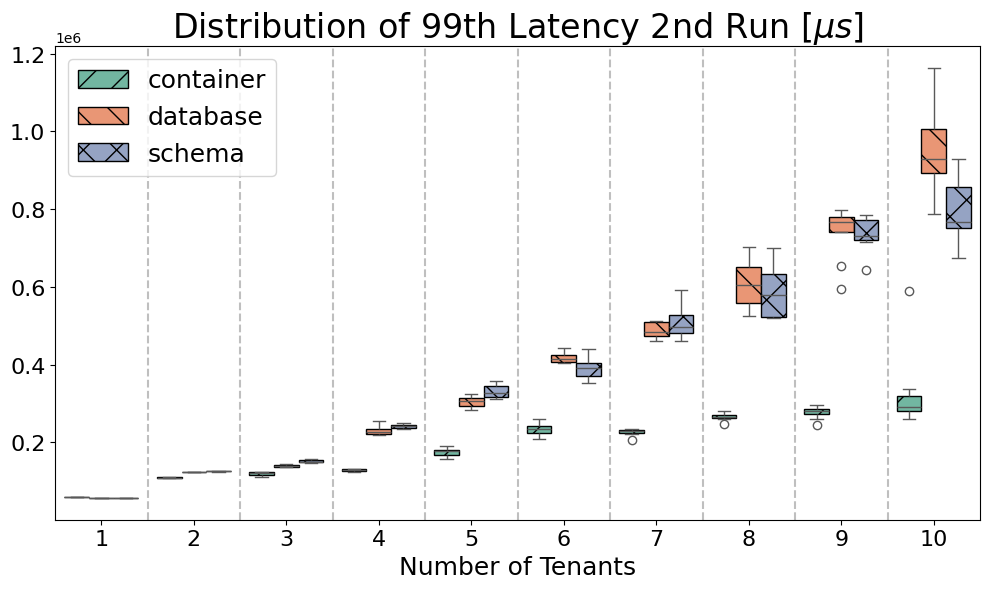

In [26]:
plot_boxplots(df_performance_second, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency 2nd Run [$\mu s$]')

# Performance Results per Total

In [27]:
df_performance = collect.get_performance_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.dropna(inplace=True)

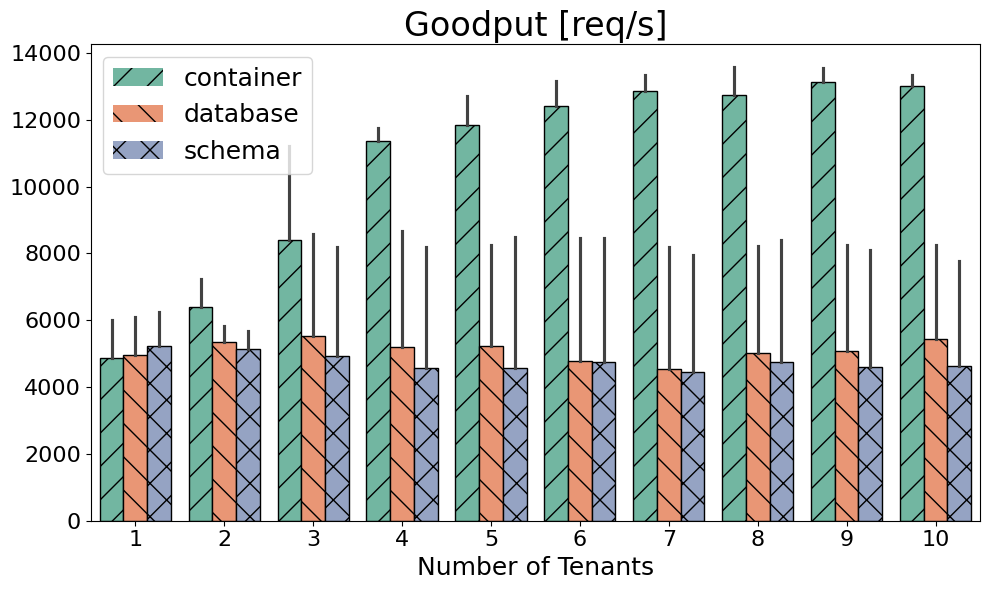

In [28]:
plot_bars(df_performance, y='Goodput (requests/second)', title='Goodput [req/s]', estimator='min')

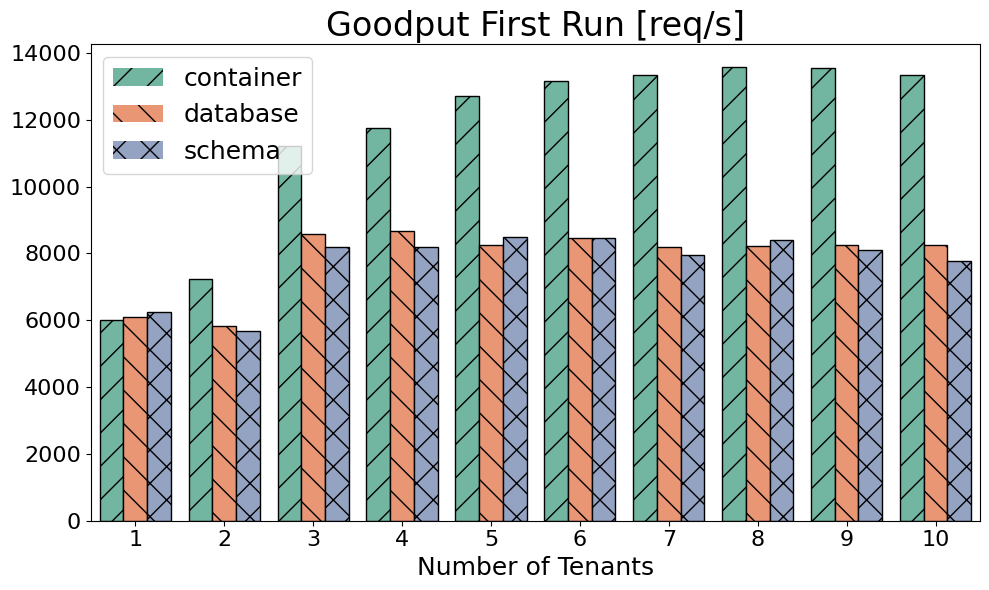

In [29]:
plot_bars(df_performance_first, y='Goodput (requests/second)', title='Goodput First Run [req/s]', estimator='min')

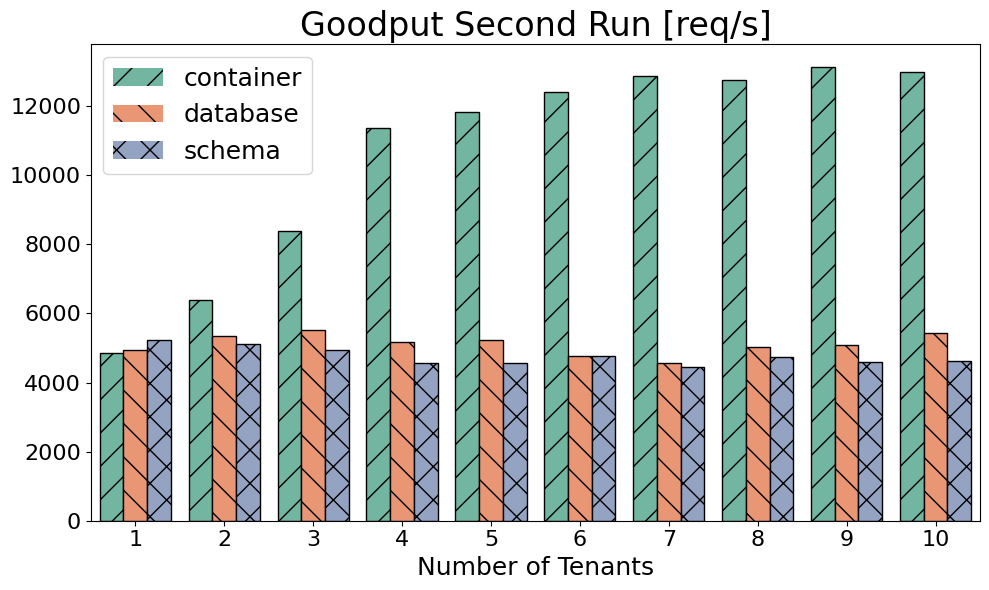

In [30]:
plot_bars(df_performance_second, y='Goodput (requests/second)', title='Goodput Second Run [req/s]', estimator='min')

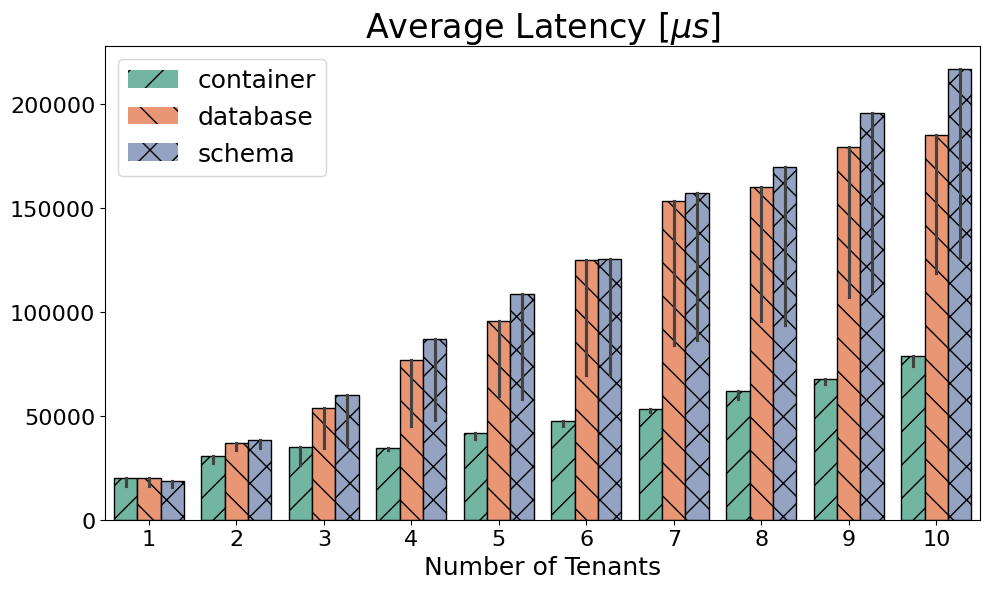

In [31]:
plot_bars(df_performance, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency [$\mu s$]', estimator='max')

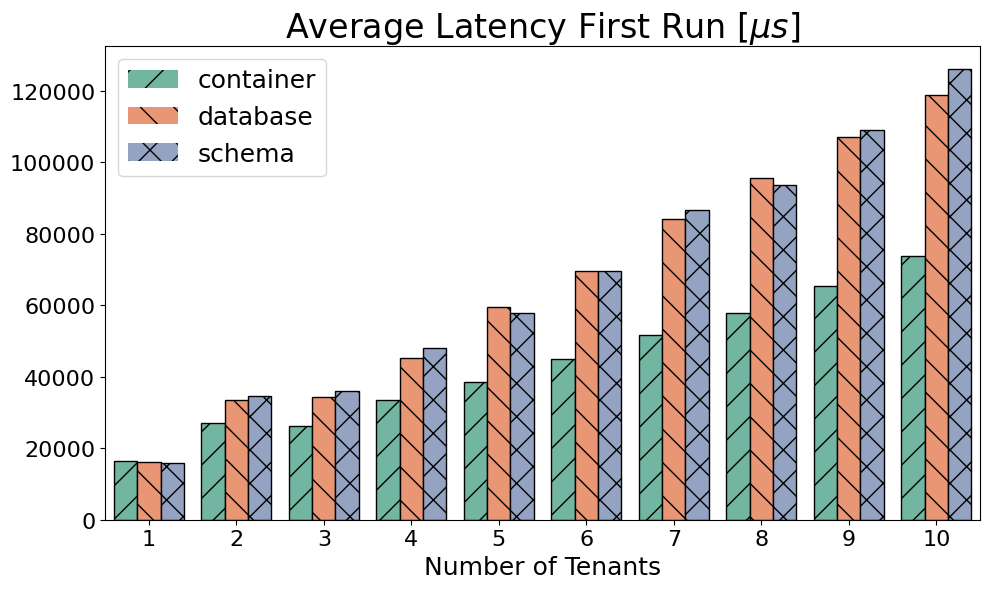

In [32]:
plot_bars(df_performance_first, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency First Run [$\mu s$]', estimator='max')

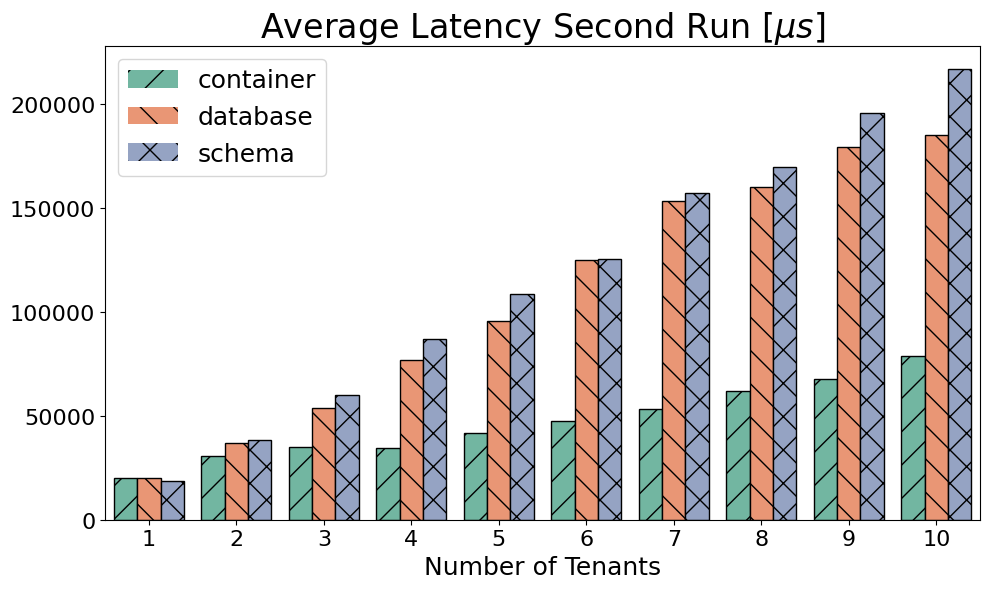

In [33]:
plot_bars(df_performance_second, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency Second Run [$\mu s$]', estimator='max')

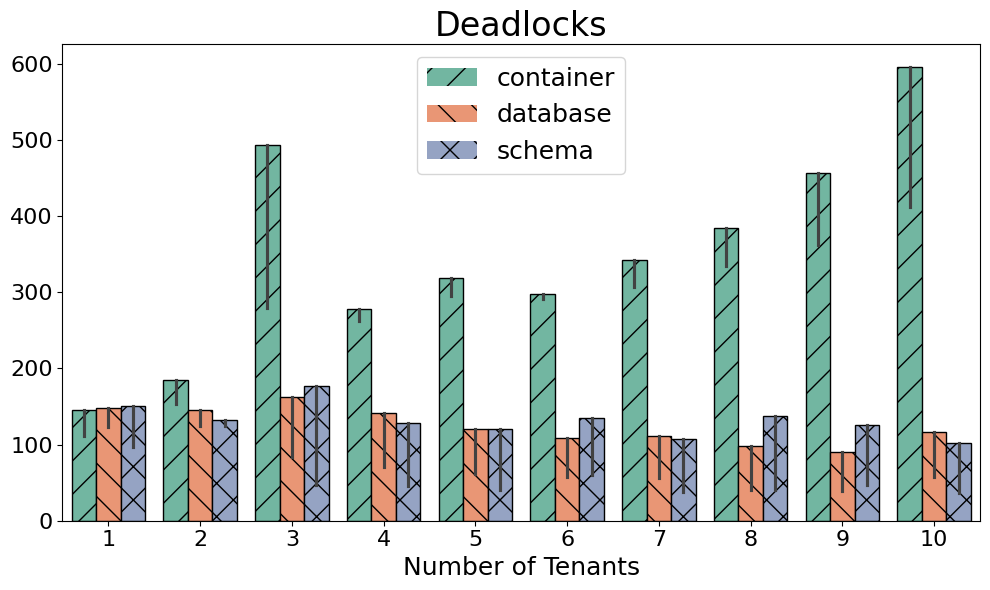

In [34]:
plot_bars(df_performance, y='num_errors', title='Deadlocks', estimator='max')

In [35]:
df_performance = collect.get_loading_time_max_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,time_load,time_ingest,time_check,terminals,pods,tenant,client,datadisk,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,249.0,96.0,151.0,1,1,0,1,2719,container,1,1758124731
PostgreSQL-1-1-65536-0-2,249.0,96.0,151.0,1,1,0,2,14192,container,1,1758124731
PostgreSQL-1-1-65536-1,242.0,83.0,156.0,1,1,,1,2726,database,1,1758122773
PostgreSQL-1-1-65536-2,242.0,83.0,156.0,1,1,,2,14412,database,1,1758122773
PostgreSQL-1-1-65536-1,264.0,108.0,152.0,1,1,,1,2719,schema,1,1758120831
PostgreSQL-1-1-65536-2,264.0,108.0,152.0,1,1,,2,14652,schema,1,1758120831
PostgreSQL-1-1-65536-0-1,295.0,91.0,201.0,1,1,0,1,2719,container,2,1758115998
PostgreSQL-1-1-65536-0-2,295.0,91.0,201.0,1,1,0,2,9430,container,2,1758115998
PostgreSQL-1-1-65536-1-1,285.0,90.0,192.0,1,1,1,1,2719,container,2,1758115998
PostgreSQL-1-1-65536-1-2,285.0,90.0,192.0,1,1,1,2,9074,container,2,1758115998


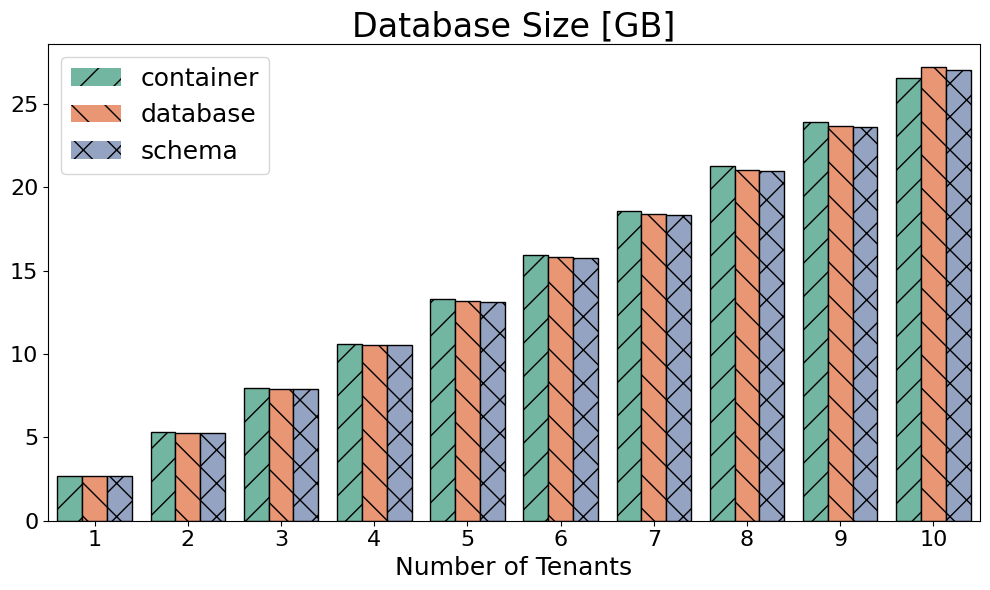

In [36]:
df_performance_first = df_performance[df_performance['client'] == '1']
# Divide datadisk by the count of rows with the same type and num_tenants
df = df_performance_first.copy()
# Create a mask for rows where type is not "container"
mask = df['type'] != 'container'

# Only apply the group count to the relevant rows
group_counts = df[mask].groupby(['type', 'num_tenants'])['datadisk'].transform('count')

# Initialize the column with NaN (or 0, if preferred)
df['datadisk_normalized'] = df['datadisk'] / 1024

# Apply the normalized value only where the mask is True
df.loc[mask, 'datadisk_normalized'] = df.loc[mask, 'datadisk'] / group_counts / 1024

plot_bars(df, y='datadisk_normalized', title='Database Size [GB]', estimator='sum')

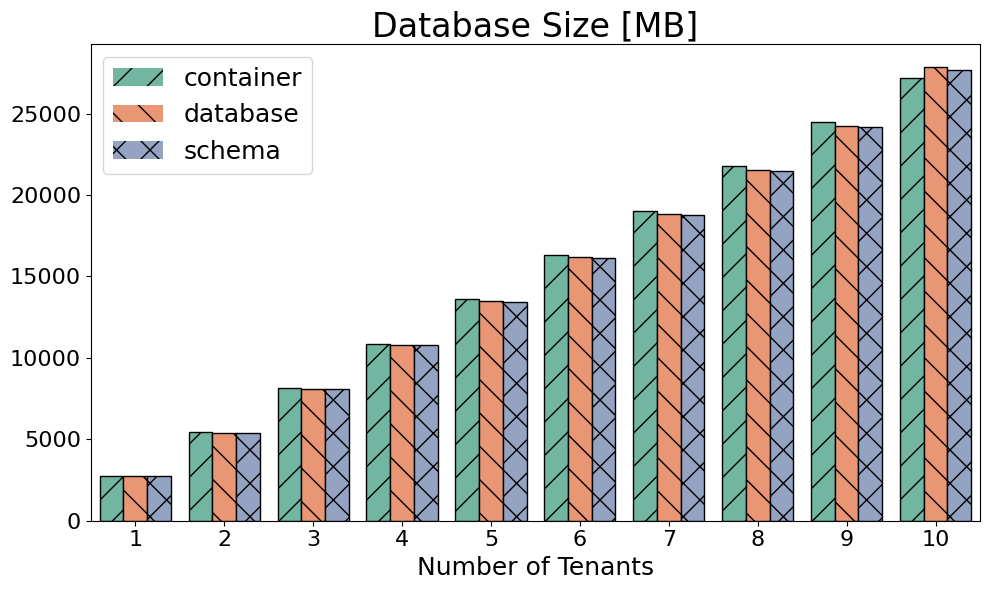

In [37]:
plot_bars(df_performance_first, y='datadisk', title='Database Size [MB]', estimator='sum')

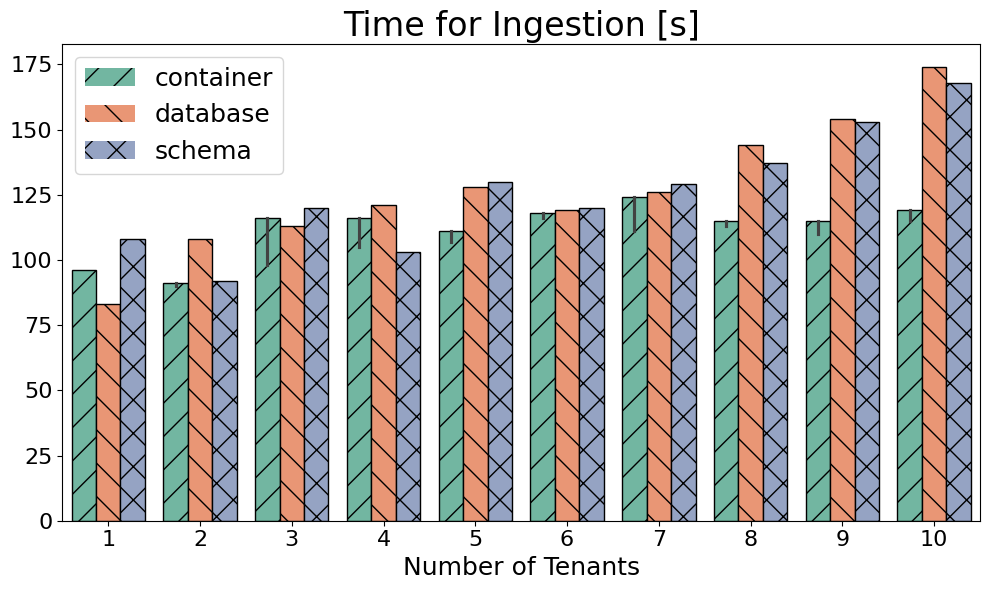

In [38]:
plot_bars(df_performance_first, y='time_ingest', title='Time for Ingestion [s]', estimator='max')

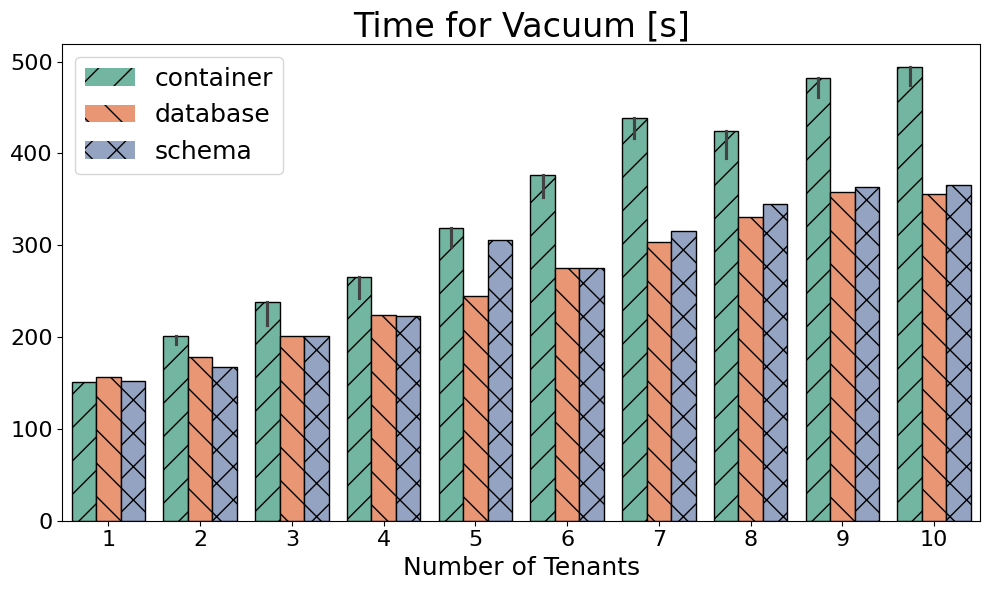

In [39]:
plot_bars(df_performance_first, y='time_check', title='Time for Vacuum [s]', estimator='max')

# Hardware Monitoring for Benchmarking Phase

In [40]:
df_performance = collect.get_monitoring_all(type="stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],17629.06,32311.54,17755.84,32837.34,17897.65,33450.68,29205.93,47092.24,21809.83,37297.97,...,59696.61,79244.6,59171.36,77688.02,118777.71,149059.55,66151.92,84951.53,65607.83,82238.82
Memory Usage Cached [MiB],17629.08,32311.56,17755.86,32837.36,17897.66,33450.7,29205.97,47092.27,21809.84,37297.99,...,59696.62,79244.61,59171.44,77688.1,118777.85,149059.68,66151.93,84951.54,65607.92,82238.91
CPU Utilization,19.54,19.98,20.82,21.25,22.05,21.78,25.05,23.68,21.37,22.1,...,38.39,22.41,38.37,20.92,51.02,50.34,40.09,25.86,37.52,20.66
CPU Throttle,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],12349.45,12983.29,13544.66,12893.37,14659.99,14254.0,15842.64,15744.33,13088.85,13907.77,...,24076.38,13827.35,25382.73,13191.97,32659.08,31151.97,24985.58,16341.76,24013.16,12874.21
CPU User Time [s],7296.17,7645.14,7841.38,7378.45,8303.67,8085.08,9641.76,9561.72,7810.55,8028.7,...,15245.01,8092.65,16005.45,7757.48,21515.59,20406.39,15952.93,9843.33,14953.04,7640.71
CPU System Time [s],5053.28,5338.15,5703.27,5514.92,6356.32,6168.92,6200.88,6182.62,5278.3,5879.08,...,8831.37,5734.7,9377.27,5434.49,11143.46,10745.57,9032.65,6498.43,9060.12,5233.51
Network Rx Total [MiB],24330.24,15381.13,25667.95,16514.92,25453.08,18163.91,29857.34,26074.96,24143.78,18300.93,...,33755.15,20292.88,33879.32,18843.12,55318.12,53032.69,33754.87,19612.29,31396.66,19603.56


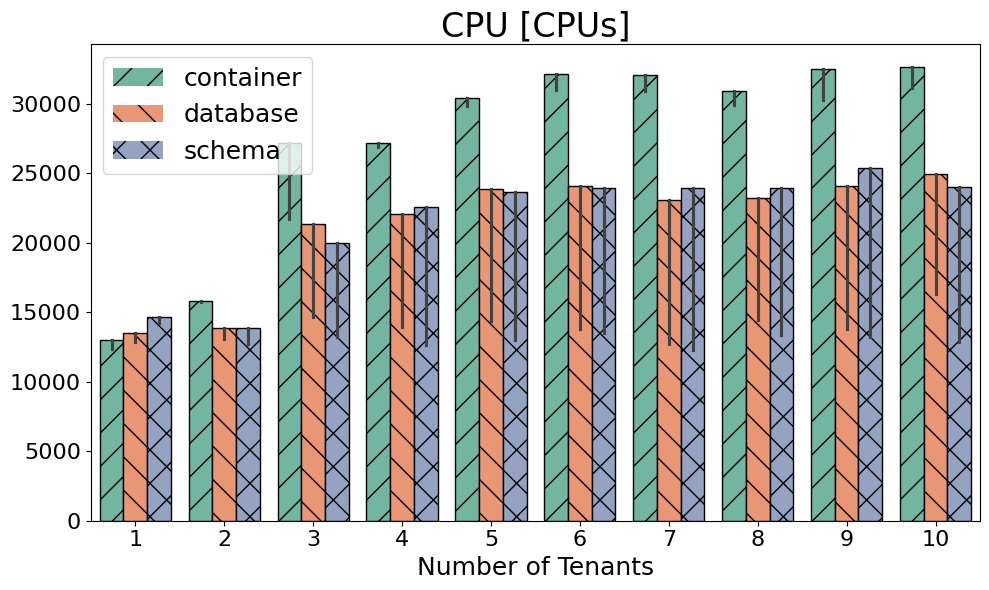

In [41]:
plot_bars(df_performance, y='CPU Utilization Time [s]', title='CPU [CPUs]', estimator='max')

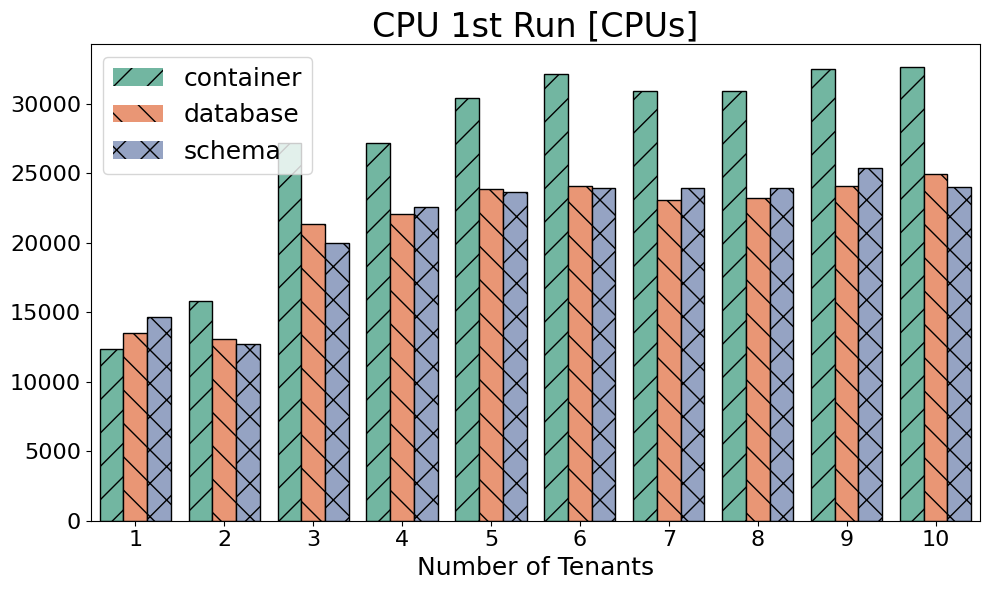

In [42]:
plot_bars(df_performance_first, y='CPU Utilization Time [s]', title='CPU 1st Run [CPUs]', estimator='max')

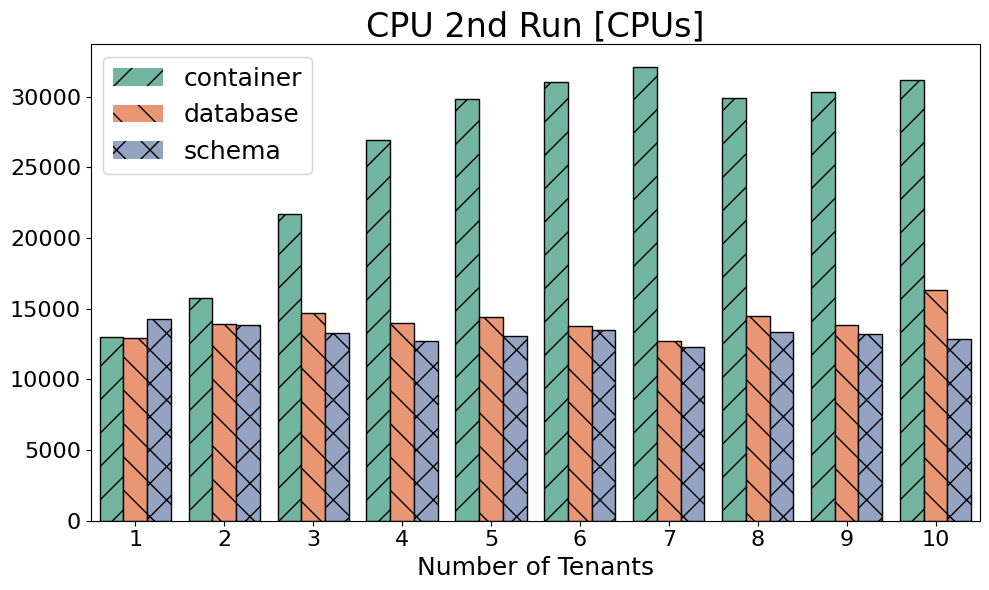

In [43]:
plot_bars(df_performance_second, y='CPU Utilization Time [s]', title='CPU 2nd Run [CPUs]', estimator='max')

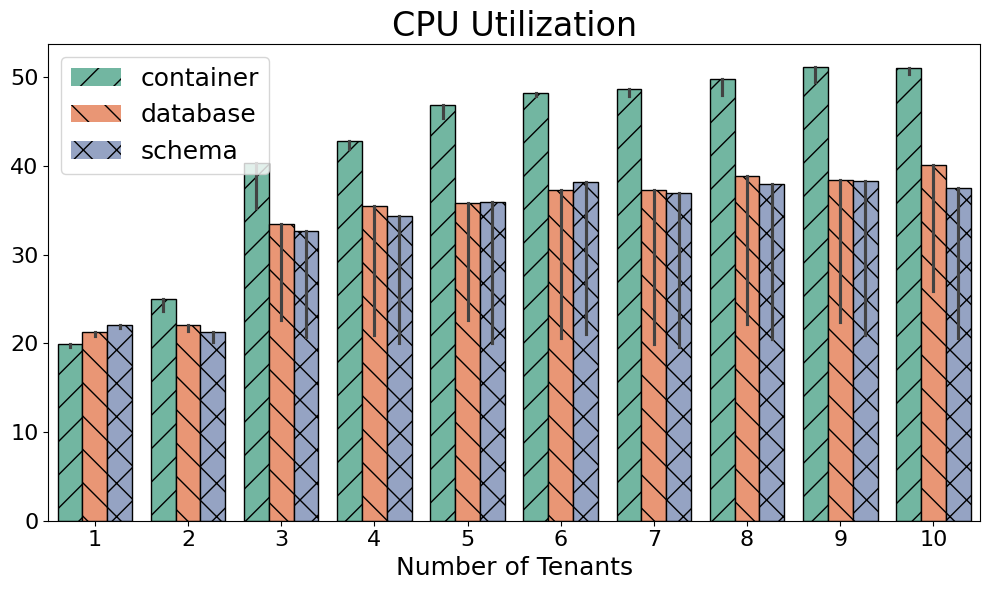

In [44]:
plot_bars(df_performance, y='CPU Utilization', title='CPU Utilization', estimator='max')

## Custom Aggregation

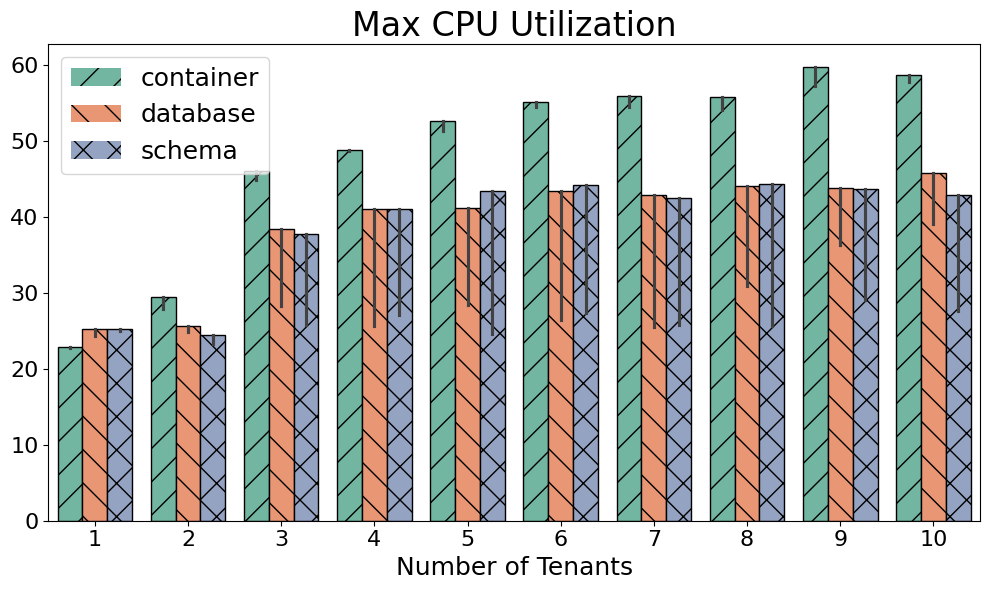

In [45]:
metric = 'total_cpu_util'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
plot_bars(df_agg, y='value', title='Max CPU Utilization', estimator='max')
#df_agg

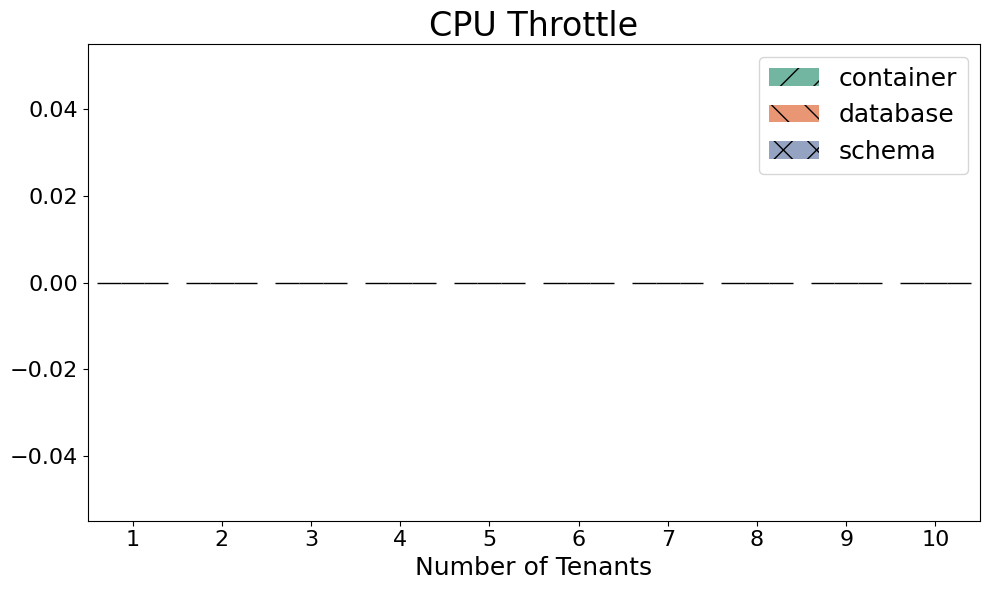

In [46]:
plot_bars(df_performance, y='CPU Throttle', title='CPU Throttle', estimator='max')

## Custom Aggregation and Scale

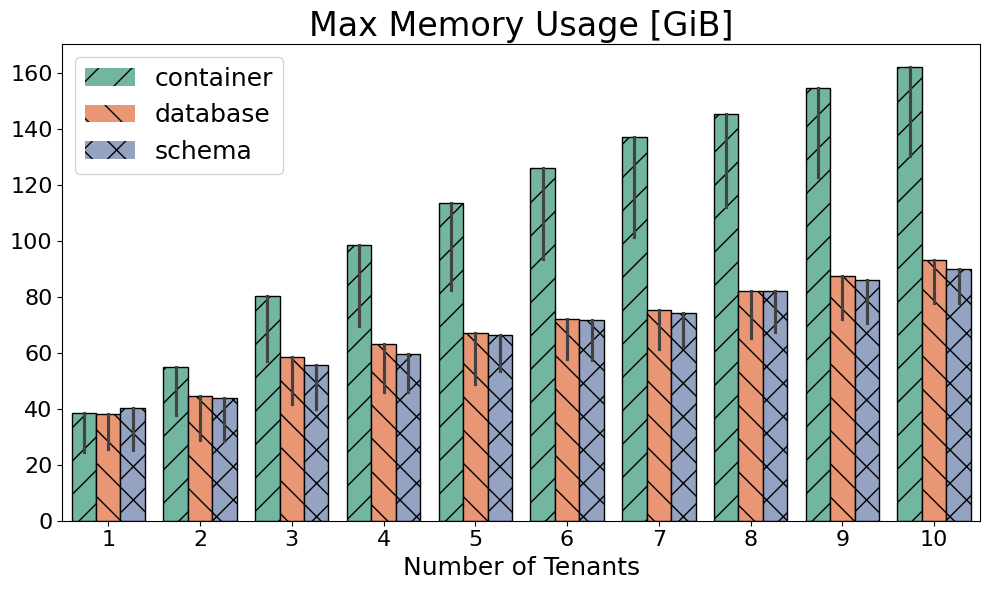

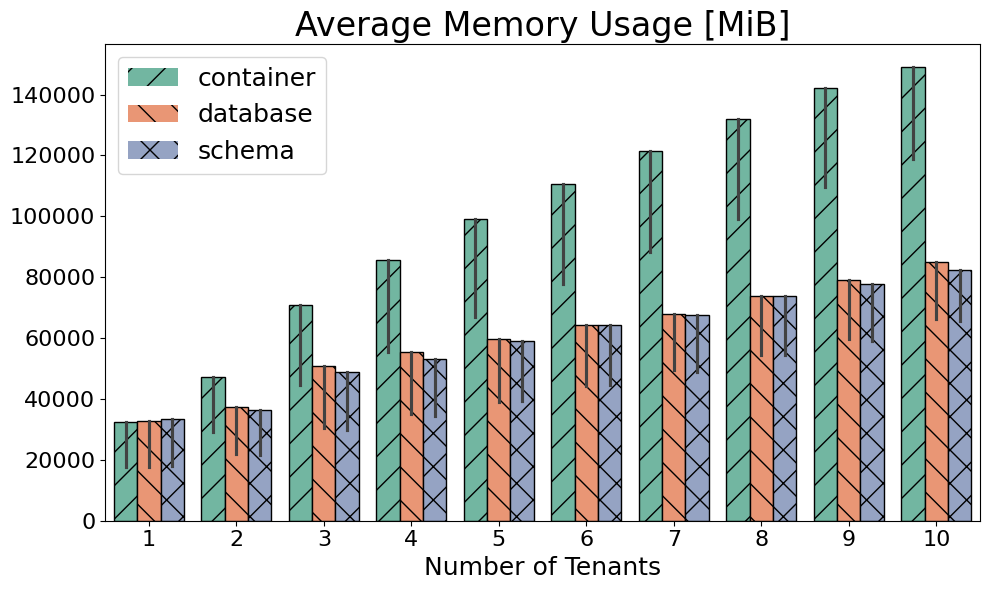

In [47]:
metric = 'total_cpu_memory'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
df_agg['value'] = df_agg['value'] / 1024.
plot_bars(df_agg, y='value', title='Max Memory Usage [GiB]', estimator='max')

plot_bars(df_performance, y='Memory Usage [MiB]', title='Average Memory Usage [MiB]', estimator='max')

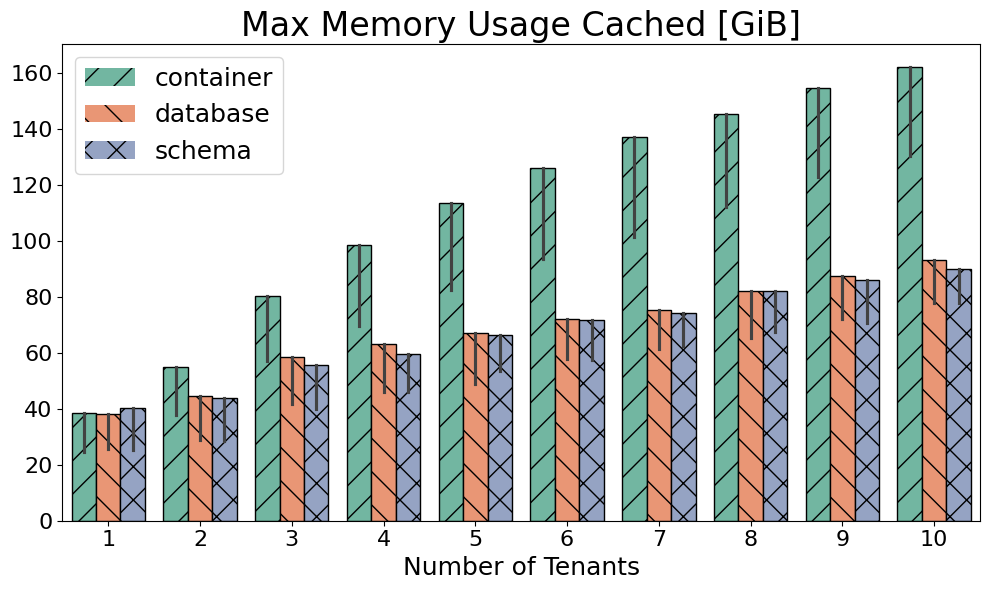

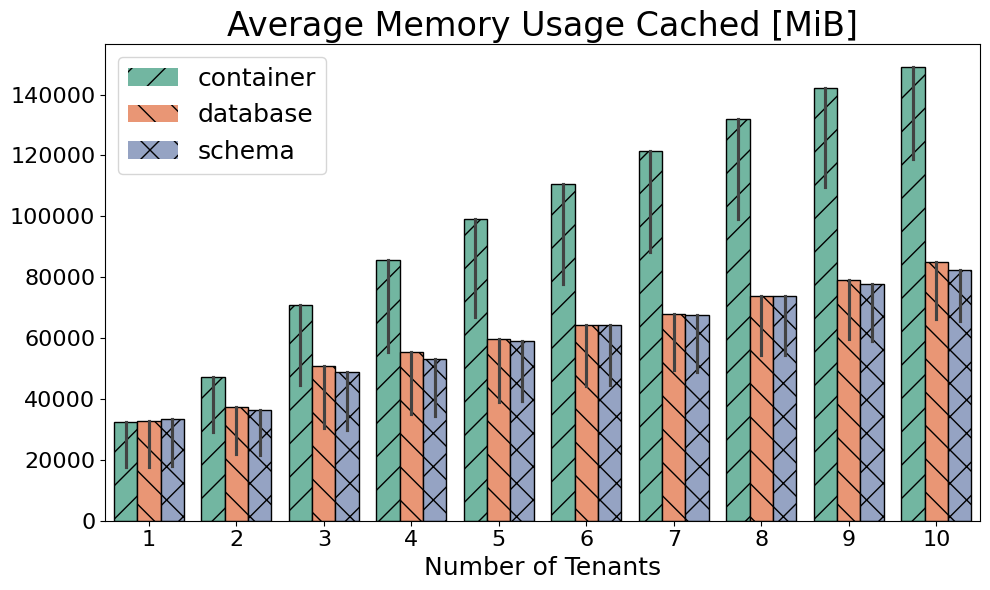

In [48]:
metric = 'total_cpu_memory_cached'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
df_agg['value'] = df_agg['value'] / 1024.
plot_bars(df_agg, y='value', title='Max Memory Usage Cached [GiB]', estimator='max')

plot_bars(df_performance, y='Memory Usage Cached [MiB]', title='Average Memory Usage Cached [MiB]', estimator='max')

# Hardware Monitoring for Loading Phase

In [49]:
#df_performance = collect.get_monitoring_all("loading")

#df_performance_first = df_performance[df_performance['client']=='1']
#df_performance_second = df_performance[df_performance['client']=='2']

#df_performance

In [50]:
#plot_bars(df_performance, y='CPU Utilization Time [s]', title='CPU [CPUs]', estimator='max')

In [51]:
#plot_bars(df_performance, y='Memory Usage [MiB]', title='Memory Usage [MiB]', estimator='max')

In [52]:
#plot_bars(df_performance, y='Memory Usage Cached [MiB]', title='Memory Usage Cached [MiB]', estimator='max')

# Efficiency

In [53]:
client = '1'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['I_Lat'] = 1./merged_df['E_Lat']
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU Utilization Time [s]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU Utilization Time [s]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Memory Usage [MiB]']
merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,Memory Usage [MiB],Memory Usage Cached [MiB],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],E_Tpx,E_Lat,E_RAM
0,1,6015.096578,146,16332.000000,55222,container,1,1758124731,17629.06,17629.08,...,0.0,inf,336.44,5.26,0.70,11.28,16.00,292.244428,0.070414,0.341203
1,1,6111.379402,148,16073.000000,54648,database,1,1758122773,17755.84,17755.86,...,0.0,inf,342.53,5.35,0.71,11.33,16.00,270.721276,0.067775,0.344190
2,1,6233.858089,151,15758.000000,54511,schema,1,1758120831,17897.65,17897.66,...,0.0,inf,346.41,5.41,0.74,11.78,16.00,255.137613,0.065793,0.348306
3,1,7230.665336,185,27175.500000,105317,container,2,1758115998,29205.93,29205.97,...,0.0,inf,442.06,6.91,0.68,10.86,32.00,273.843198,0.048194,0.247575
4,1,5842.011878,146,33636.500000,122029,database,2,1758113938,21809.83,21809.84,...,0.0,inf,385.69,6.03,0.64,10.27,16.00,267.801001,0.047659,0.267861
5,1,5663.767716,125,34699.000000,124602,schema,2,1758111904,21555.98,21556.01,...,0.0,inf,375.77,5.87,0.63,10.04,16.00,267.068152,0.047591,0.262747
6,1,11221.429240,279,26283.000000,113244,container,3,1758194134,44568.59,44568.64,...,0.0,inf,688.93,10.76,1.08,17.20,48.00,247.443830,0.037394,0.251779
7,1,8590.512562,163,34359.333333,124096,database,3,1758156855,30323.11,30323.12,...,0.0,inf,584.70,9.14,0.95,15.17,16.00,241.697707,0.036943,0.283299
8,1,8201.121208,177,36003.333333,138803,schema,3,1758154781,29923.84,29923.87,...,0.0,inf,563.93,8.81,0.91,14.54,16.00,246.092822,0.037271,0.274066
9,1,11754.561133,278,33456.750000,153121,container,4,1758165872,55556.64,55556.72,...,0.0,inf,768.99,12.01,1.04,16.72,64.00,259.094611,0.033137,0.211578


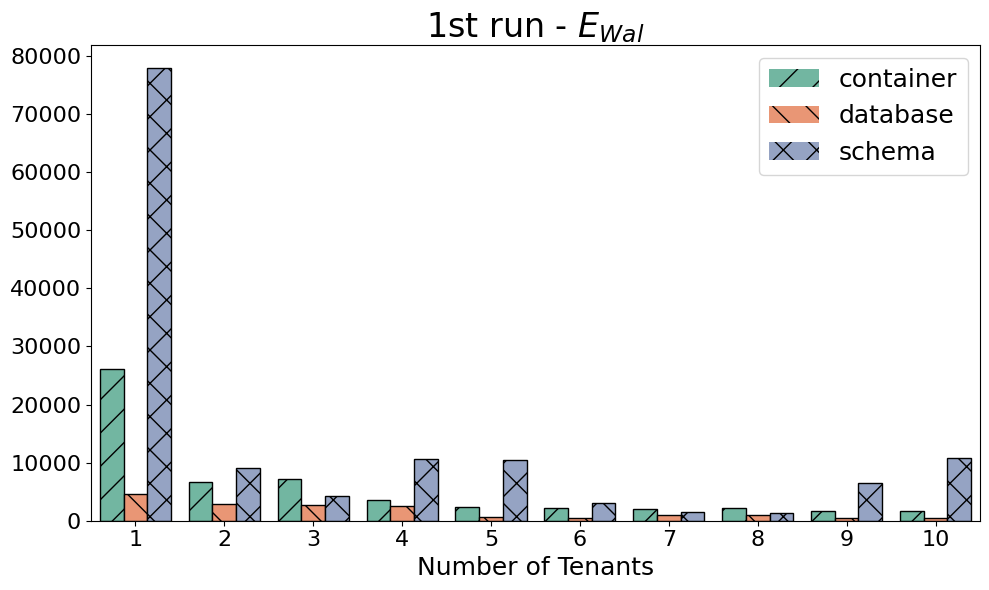

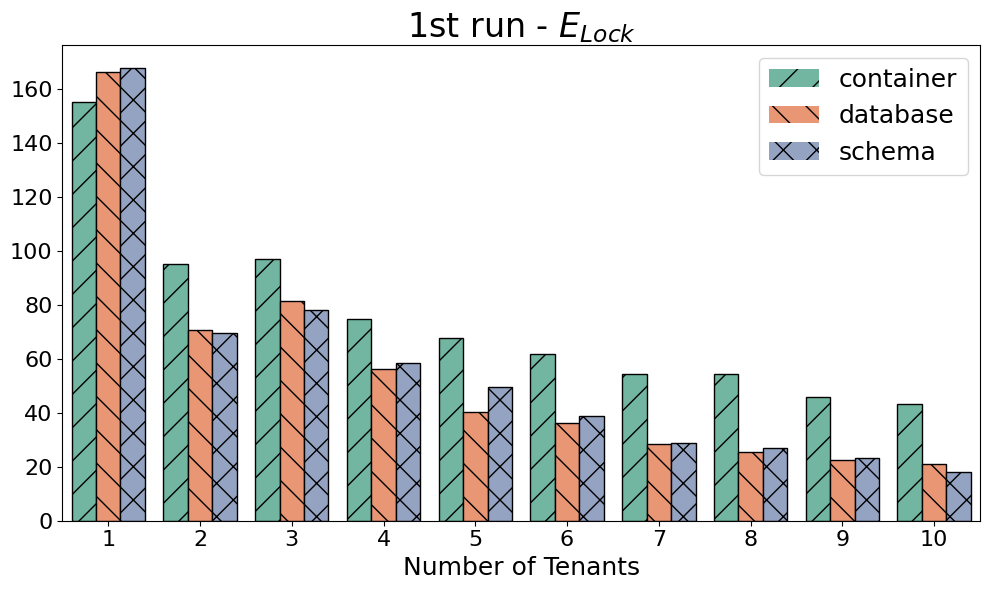

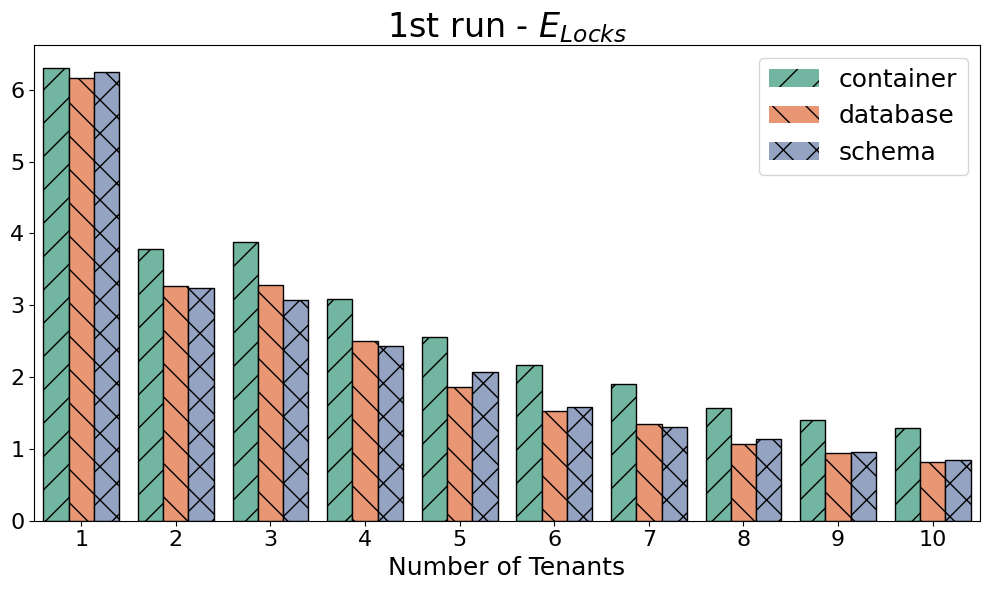

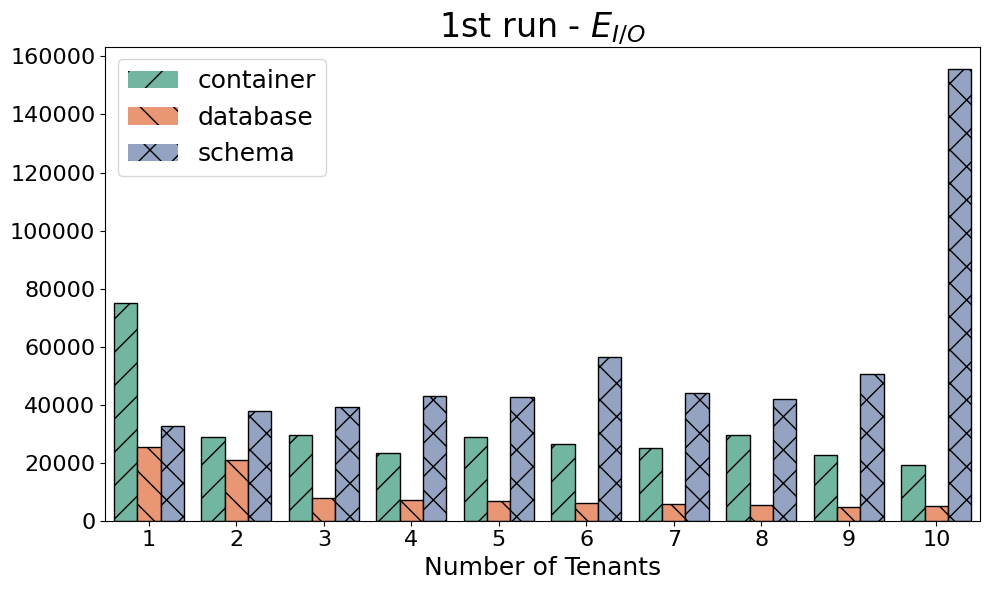

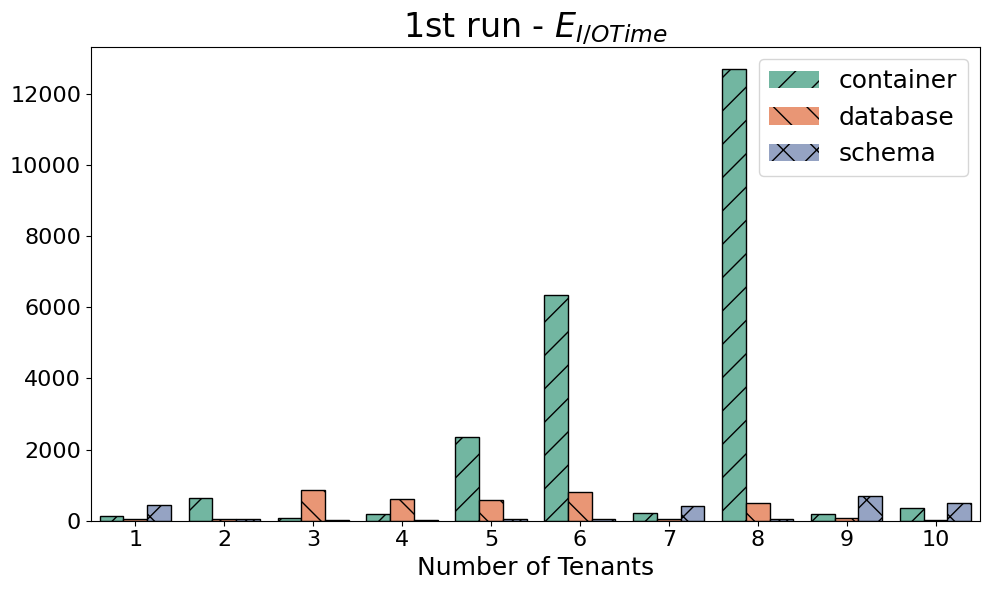

In [54]:
merged_df['E_Wal'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on WAL']
merged_df['E_Lock'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on Locks']
merged_df['E_IO'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on I/O']
merged_df['E_IOTime'] = (merged_df['Goodput (requests/second)']) / merged_df['Total I/O Wait Time [s]']
merged_df['E_Locks'] = (merged_df['Goodput (requests/second)']) / merged_df['Total Locks Current']


plot_bars(merged_df, y='E_Wal', title='1st run - $E_{Wal}$', estimator='max')
plot_bars(merged_df, y='E_Lock', title='1st run - $E_{Lock}$', estimator='max')
plot_bars(merged_df, y='E_Locks', title='1st run - $E_{Locks}$', estimator='max')
plot_bars(merged_df, y='E_IO', title='1st run - $E_{I/O}$', estimator='max')
plot_bars(merged_df, y='E_IOTime', title='1st run - $E_{I/O Time}$', estimator='max')


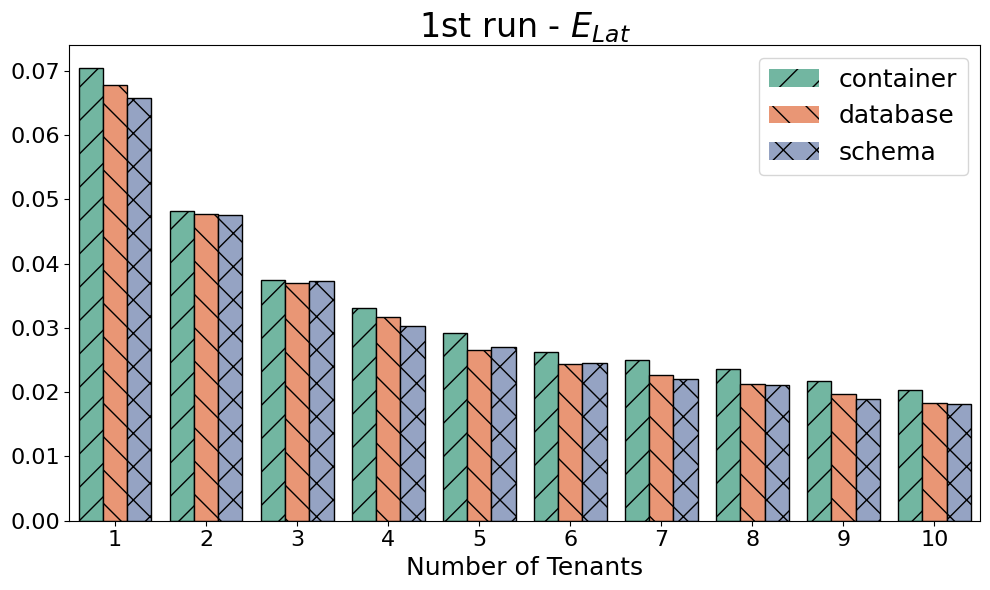

In [55]:
plot_bars(merged_df, y='E_Lat', title='1st run - $E_{Lat}$', estimator='max')

In [56]:
#plot_bars(merged_df, y='I_Lat', title='1st run - $I_{Lat}$', estimator='max')

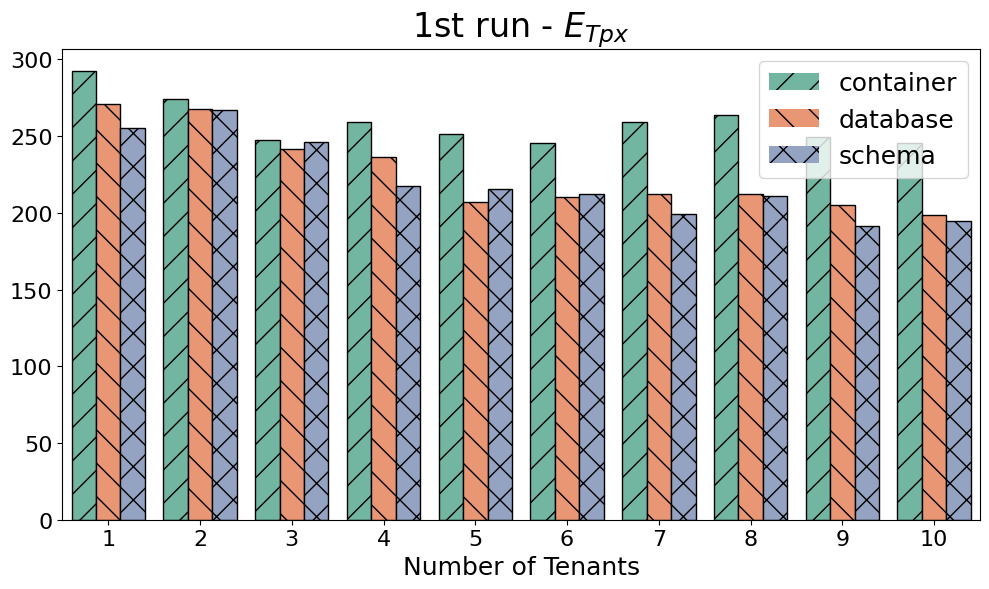

In [57]:
plot_bars(merged_df, y='E_Tpx', title='1st run - $E_{Tpx}$', estimator='max')

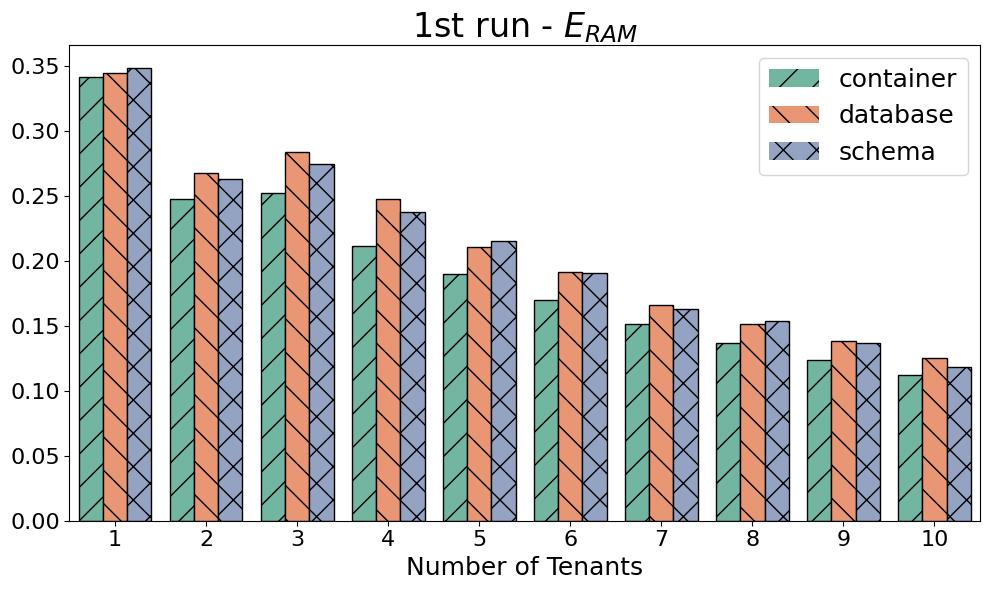

In [58]:
plot_bars(merged_df, y='E_RAM', title='1st run - $E_{RAM}$', estimator='min')

In [59]:
client = '2'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['CPUs/Request'] = merged_df['CPU [CPUs]'] / merged_df['Goodput (requests/second)'] / 600.
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU Utilization Time [s]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU Utilization Time [s]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Memory Usage [MiB]']

merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,Memory Usage [MiB],Memory Usage Cached [MiB],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],E_Tpx,E_Lat,E_RAM
0,2,4858.307723,111,20225.000000,58637,container,1,1758124731,32311.54,32311.56,...,0.0,inf,875.30,13.68,0.69,10.99,16.00,224.518179,0.061711,0.150358
1,2,4947.582788,123,19870.000000,57566,database,1,1758122773,32837.34,32837.36,...,0.0,inf,894.57,13.98,0.71,11.40,16.00,230.238462,0.062477,0.150669
2,2,5239.926243,97,18753.000000,56460,schema,1,1758120831,33450.68,33450.70,...,0.0,inf,919.48,14.37,0.76,12.11,16.00,220.566560,0.061164,0.156646
3,2,6384.149647,153,30778.500000,111120,container,2,1758115998,47092.24,47092.27,...,0.0,inf,1102.04,17.22,0.77,12.45,32.00,243.293286,0.045427,0.135567
4,2,5335.013092,125,36857.000000,124767,database,2,1758113938,37297.97,37297.99,...,0.0,inf,954.76,14.92,0.78,12.54,16.00,230.159677,0.044168,0.143038
5,2,5125.620805,132,38362.000000,126677,schema,2,1758111904,36448.61,36448.63,...,0.0,inf,921.75,14.40,0.75,12.01,16.00,221.735404,0.043353,0.140626
6,2,8395.246314,493,34962.333333,123588,container,3,1758194134,70825.91,70825.95,...,0.0,inf,1331.74,20.81,1.20,19.15,39.01,231.921744,0.036289,0.118534
7,2,5516.149524,84,53767.666667,144525,database,3,1758156855,50681.58,50681.60,...,0.0,inf,1360.80,21.26,0.94,15.03,16.00,225.436507,0.035592,0.108839
8,2,4943.163107,47,60141.333333,157567,schema,3,1758154781,48784.81,48784.84,...,0.0,inf,1279.84,20.00,0.85,13.68,16.00,223.887647,0.035428,0.101326
9,2,11367.889179,263,34588.500000,132333,container,4,1758165872,85791.60,85791.67,...,0.0,inf,1880.77,29.39,1.38,22.13,64.00,253.384606,0.032772,0.132506


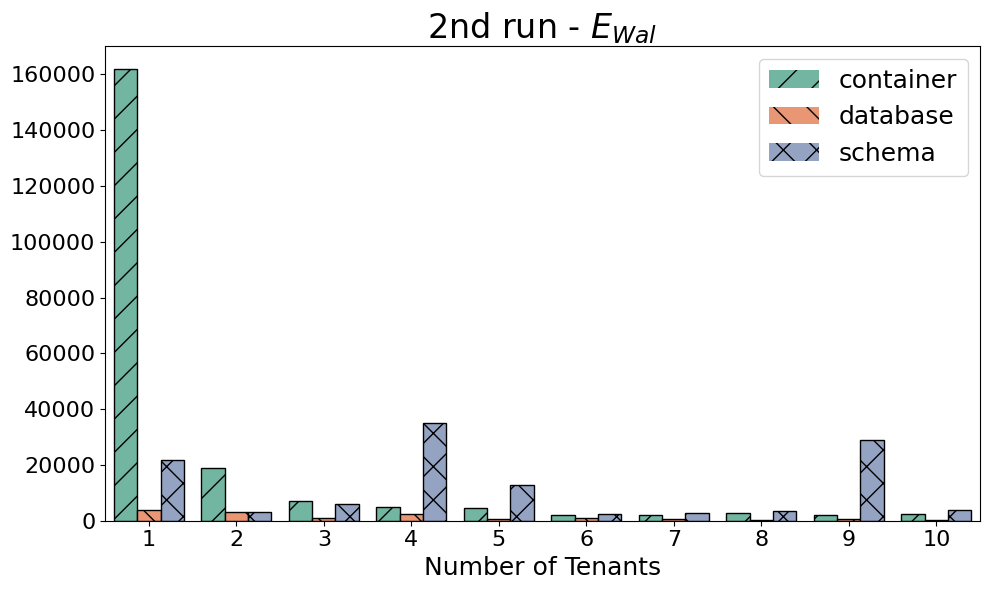

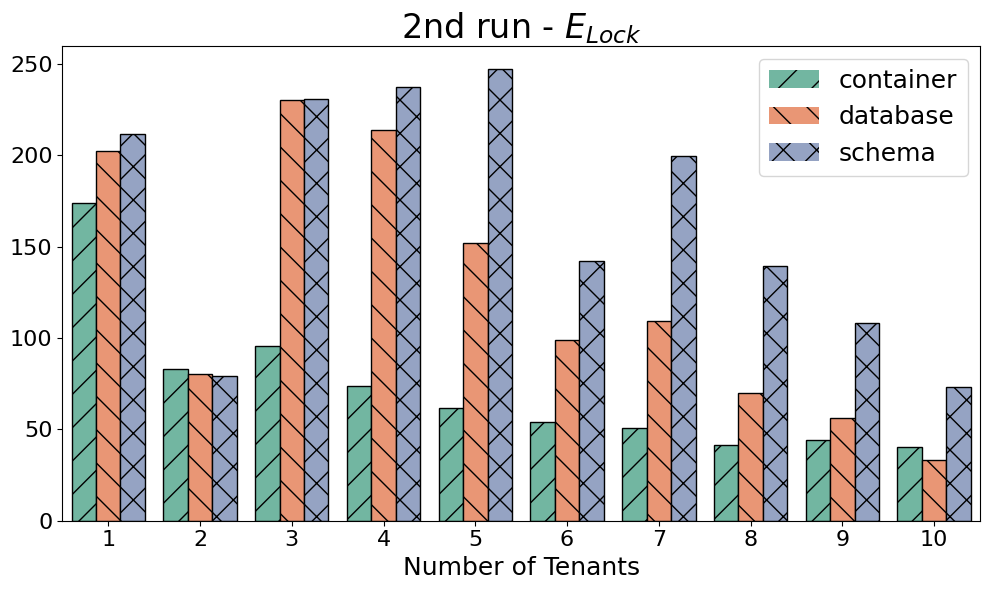

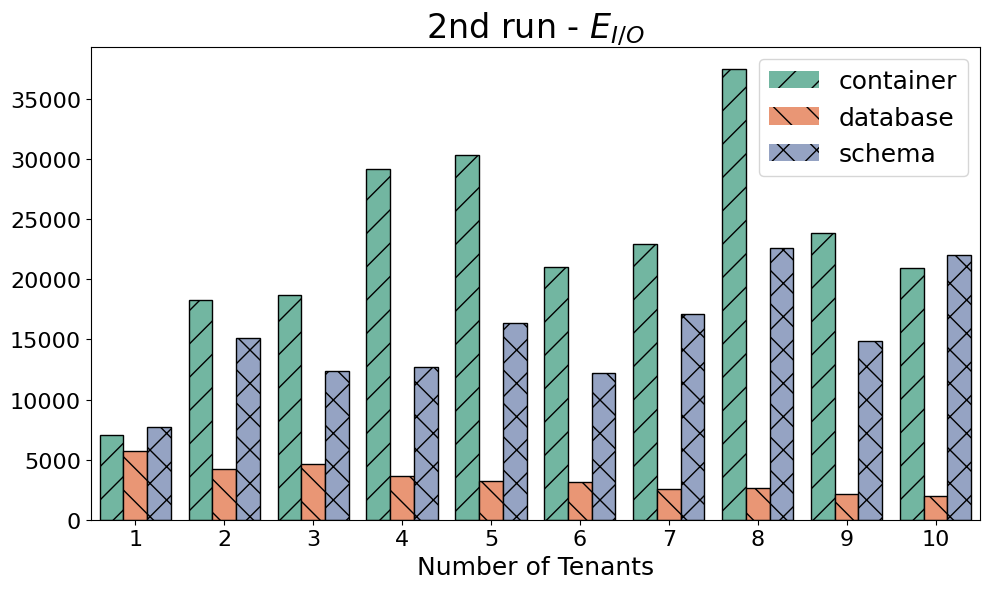

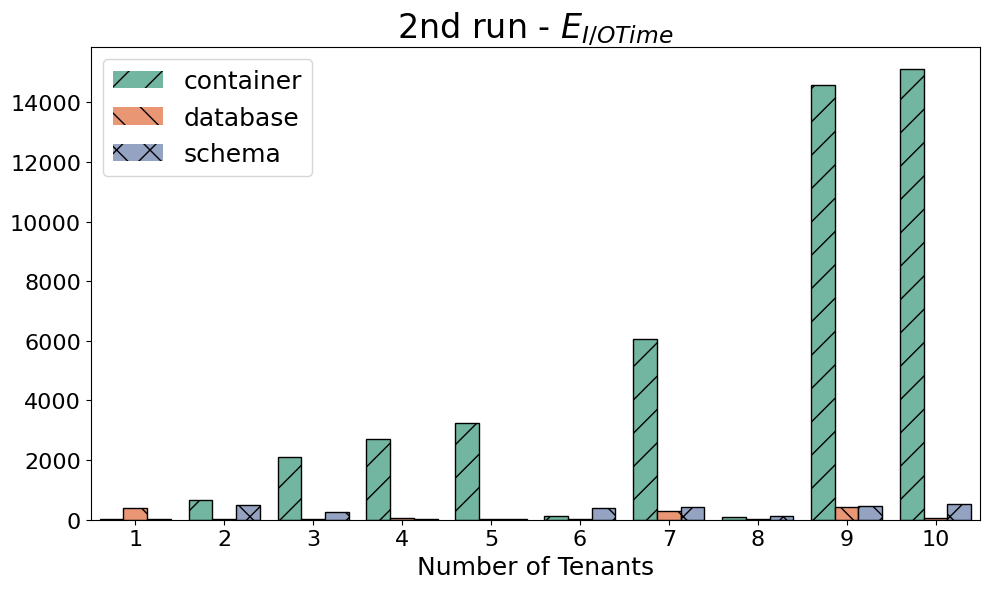

In [60]:
merged_df['E_Wal'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on WAL']
merged_df['E_Lock'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on Locks']
merged_df['E_IO'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on I/O']
merged_df['E_IOTime'] = (merged_df['Goodput (requests/second)']) / merged_df['Total I/O Wait Time [s]']

plot_bars(merged_df, y='E_Wal', title='2nd run - $E_{Wal}$', estimator='max')
plot_bars(merged_df, y='E_Lock', title='2nd run - $E_{Lock}$', estimator='max')
plot_bars(merged_df, y='E_IO', title='2nd run - $E_{I/O}$', estimator='max')
plot_bars(merged_df, y='E_IOTime', title='2nd run - $E_{I/O Time}$', estimator='max')


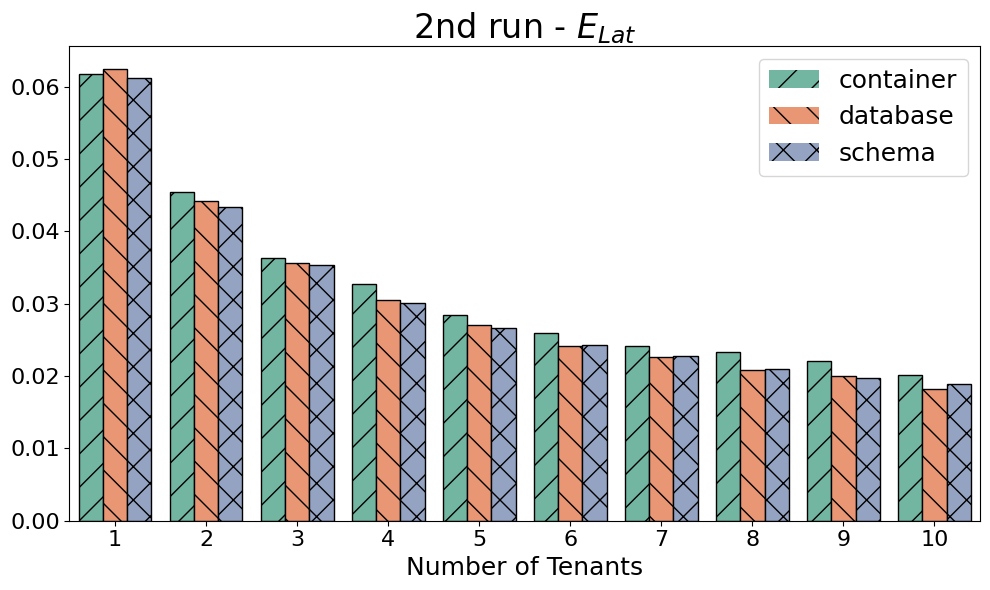

In [61]:
plot_bars(merged_df, y='E_Lat', title='2nd run - $E_{Lat}$', estimator='max')

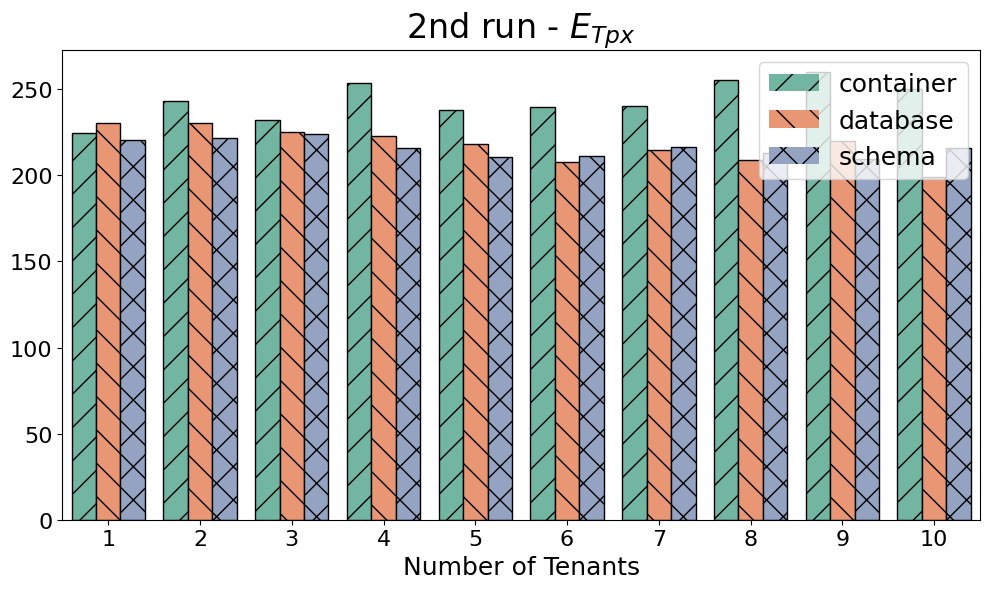

In [62]:
plot_bars(merged_df, y='E_Tpx', title='2nd run - $E_{Tpx}$', estimator='max')

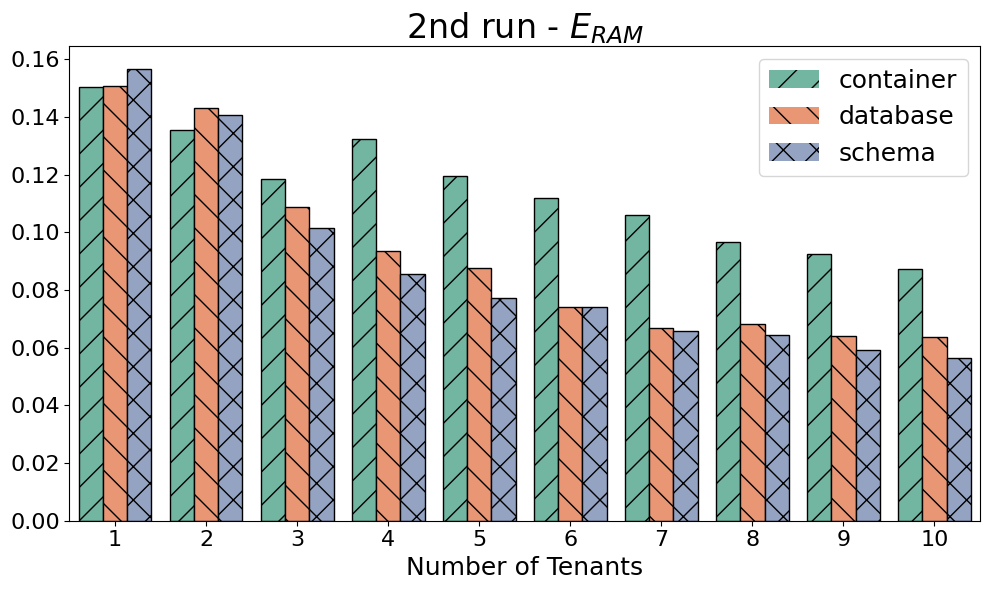

In [63]:
plot_bars(merged_df, y='E_RAM', title='2nd run - $E_{RAM}$', estimator='max')

In [64]:
import os
import zipfile

def zip_all_results():
    # Set the base directory containing the folders
    base_dir = path # "/path/to/your/folders"  # CHANGE THIS to your actual directory
    # List all folder names in the directory
    folder_names = codes
    # Create a zip for each folder
    for folder in folder_names:
        folder_path = os.path.join(base_dir, folder)
        zip_path = os.path.join(base_dir, f"{folder}.zip")
        print(f"Zipping {folder_path} to {zip_path}...")
        with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(folder_path):
                for file in files:
                    abs_path = os.path.join(root, file)
                    rel_path = os.path.relpath(abs_path, folder_path)
                    zipf.write(abs_path, arcname=os.path.join(folder, rel_path))
    print("✅ Done zipping all folders.")


In [65]:
#zip_all_results()